# Imports

In [53]:
# System
import sys
import os
import math
import copy
# Time
import time
# Date time
import datetime as dt
# PyTorch framework
import torch
from torch import nn
# Work with arrays
import numpy as np
# Work with dataframes
import pandas as pd
# Make figures
import matplotlib.pyplot as plt
from matplotlib import colors
import seaborn as sns
# Hyperparameters optimization
import optuna

# Amplitude functions

## Gaussian

In [3]:
class Gaussian(nn.Module):
  """Custom Gaussian amplitude function class"""

  def __init__(self, config, bandwidth=1.0):
    super().__init__()
    self.coordinateSpaceDim = config['coordinate space dimension']
    self.numberOfStates = config['number of states']
    self.device = config['device']

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    forward = torch.ones(
      (
        len(x),
        self.numberOfStates
      ),
      device=self.device
    )
    forward = torch.mul(
      forward.t(),
      torch.exp(-torch.sum(x**2, axis=1) / 2)
    ).t()
    return forward

  def gradient(self, x: torch.Tensor) -> torch.Tensor:
    gradient = torch.ones(
      (
        len(x),
        self.coordinateSpaceDim,
        self.numberOfStates
      ),
      device=self.device
    )
    for coordinateNumber in range(self.coordinateSpaceDim):
      temporalTerm = torch.ones(
        (
          len(x),
          self.numberOfStates
        ),
        device=self.device
      )
      temporalTerm = torch.mul(
        temporalTerm.t(),
        torch.exp(-torch.sum(x**2, axis=1) / 2) * (-2 * x[:, coordinateNumber] / 2),
      ).t()
      gradient[:, coordinateNumber, :] = temporalTerm
    return gradient

  def laplacian(self, x: torch.Tensor) -> torch.Tensor:
    laplacian = torch.ones(
      (
        len(x),
        self.numberOfStates
      ),
      device=self.device
    )
    laplacian = torch.mul(
      laplacian.t(),
      torch.exp(-torch.sum(x**2, axis=1) / 2)
      * (
        torch.sum((-2 * x / 2) ** 2, axis=1)
        - 2 * torch.sum(torch.ones_like(x) / 2, axis=1)
      )
    ).t()
    return laplacian


# Neural network

In [4]:
class NeuralNetwork(nn.Module):
  """Class for a neural network"""

  def __init__(self, config):
    super().__init__()
    self.coordinateSpaceDim = config['coordinate space dimension']
    self.numberOfStates = config['number of states']
    self.hiddenLayerSize = config['hidden layer size']
    self.device = config['device']
    self.defActivationFunction(config)
    self.numberOfHiddenLayers = config['number of hidden layers']
    self.defAndInitStack(config['std of initial weights'])
    self.stack.to(self.device)

  def defActivationFunction(self, config):
    if config['activation function'] == 'sin':
      self.activationFunction = CustomSin()
    elif config['activation function'] == 'tanh':
      self.activationFunction = CustomTanh()
    else:
      print("INVALID ACTIVATION FUNCTION NAME")
      sys.exit(1)

  def defAndInitStack(self, stdOfInitWeights):
    self.stack = nn.Sequential()
    self.stack.append(
      nn.Linear(
        self.coordinateSpaceDim,
        self.hiddenLayerSize
      )
    )
    self.stack.append(
      self.activationFunction
    )
    for hiddenLayerNumber in range(self.numberOfHiddenLayers-1):
      self.stack.append(
        nn.Linear(
          self.hiddenLayerSize,
          self.hiddenLayerSize
        )
      )
      self.stack.append(
        self.activationFunction
      )
    self.stack.append(
      nn.Linear(
        self.hiddenLayerSize,
        self.numberOfStates
      )
    )
    self.stack.append(
      self.activationFunction
    )
    for stackSliceNumber in range(len(self.stack)):
      if "weight" in dir(self.stack[stackSliceNumber]):
        nn.init.normal_(
          self.stack[stackSliceNumber].weight,
          0,
          stdOfInitWeights
        )

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    return self.stack(x)

  def gradient(self, x: torch.Tensor) -> torch.Tensor:
    gradient = (
      torch.zeros(
        (
          len(x),
          self.coordinateSpaceDim,
          self.numberOfStates
        ),
        device = self.device
      )
    )
    for coordinateNumber in range(self.coordinateSpaceDim):
      firstDerivative = self.activationFunction.firstDerivative(
        self.stack[0](x)
      ) * self.stack[0].weight[:, coordinateNumber]
      function = self.stack[0*2+1](self.stack[0*2](x))
      for hiddenLayerNumber in range(1, self.numberOfHiddenLayers + 1):
        firstDerivative = self.activationFunction.firstDerivative(
          self.stack[hiddenLayerNumber * 2](function)
        ) * torch.matmul(
          firstDerivative, self.stack[hiddenLayerNumber * 2].weight.t()
        )
        function = self.stack[hiddenLayerNumber * 2 + 1](
          self.stack[hiddenLayerNumber * 2](function)
        )
      gradient[:, coordinateNumber, :] = firstDerivative
    return gradient

  def laplacian(self, x: torch.Tensor) -> torch.Tensor:
    preresult = torch.ones(
      (
        len(x),
        self.coordinateSpaceDim,
        self.numberOfStates
      ),
      device=self.device
    )
    for coordinateNumber in range(self.coordinateSpaceDim):
      firstDerivative = self.activationFunction.firstDerivative(
        self.stack[0](x)
      ) * self.stack[0].weight[:, coordinateNumber]
      secondDerivative = self.activationFunction.secondDerivative(
        self.stack[0](x)
      ) * self.stack[0].weight[:, coordinateNumber] ** 2
      function = self.stack[0 * 2 + 1](self.stack[0 * 2](x))
      for hiddenLayerNumber in range(1, self.numberOfHiddenLayers + 1):
        secondDerivative = self.activationFunction.secondDerivative(
          self.stack[hiddenLayerNumber * 2](function)
        ) * torch.matmul(
          firstDerivative, self.stack[hiddenLayerNumber * 2].weight.t()
        ) ** 2 \
        + self.activationFunction.firstDerivative(
          self.stack[hiddenLayerNumber * 2](function)
        ) * torch.matmul(
            secondDerivative, self.stack[hiddenLayerNumber * 2].weight.t()
        )
        firstDerivative = self.activationFunction.firstDerivative(
          self.stack[hiddenLayerNumber * 2](function)
        ) * torch.matmul(
          firstDerivative, self.stack[hiddenLayerNumber * 2].weight.t()
        )
        function = self.stack[hiddenLayerNumber * 2 + 1](
          self.stack[hiddenLayerNumber * 2](function)
        )
      preresult[:, coordinateNumber, :] = secondDerivative
    return torch.sum(preresult, axis=1)

class CustomSin(nn.Module):
    """Custom sin activation function class"""

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return torch.sin(x)

    def firstDerivative(self, x: torch.Tensor) -> torch.Tensor:
        return torch.cos(x)

    def secondDerivative(self, x: torch.Tensor) -> torch.Tensor:
        return -torch.sin(x)

class CustomTanh(nn.Module):
    """Custom tanh activation function class"""

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return torch.tanh(x)

    def firstDerivative(self, x: torch.Tensor) -> torch.Tensor:
        return 1 / torch.cosh(x) ** 2

    def secondDerivative(self, x: torch.Tensor) -> torch.Tensor:
        return -2 * torch.sinh(x) / torch.cosh(x) ** 3

# Distribution density

In [5]:
def distributionDensity(x: torch.Tensor) -> torch.Tensor:
    bandwidth = 0.2
    res = torch.sum(
        torch.exp(-torch.cdist(x, x, p=2)**2 / 2 / bandwidth**2),
        axis=1
    )
    return (res / res.sum())

# Trial function

In [6]:
class TrialFunction(nn.Module):
  """Trial function class"""

  def __init__(self, config, name: str):
    """Initialize trial function"""
    super().__init__()
    self.name = name
    self.PATH = "../models/" + self.name + ".pt"
    self.defDevice(config)
    self.neuralNetwork = NeuralNetwork(config)
    self.defAmplitudeFunction(config)
    print("Trial function with name "+name+" has been created")

  def defDevice(self, config):
    """Define device"""
    self.device = config['device']

  def defAmplitudeFunction(self, config):
    """Define amplitude function"""
    if config['amplitude function'] == 'gaussian':
      self.amplitudeFunction = Gaussian(config)
    else:
      print("INVALID AMPLITUDE FUNCTION NAME")
      sys.exit(1)

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    forward = self.neuralNetwork(x) * self.amplitudeFunction(x)
    return forward

  def gradient(self, x: torch.Tensor) -> torch.Tensor:
    gradient = (
      torch.zeros(
        (
          len(x),
          self.neuralNetwork.coordinateSpaceDim,
          self.neuralNetwork.numberOfStates
        ),
        device = self.device
      )
    )
    theAmplitudeFunction = self.amplitudeFunction(x)
    theAmplitudeFunctionGradient = self.amplitudeFunction.gradient(x)
    theNeuralNetwork = self.neuralNetwork(x)
    theNeuralNetworkGradient = self.neuralNetwork.gradient(x)
    for coordinateNumber in range(self.neuralNetwork.coordinateSpaceDim):
      gradient[:, coordinateNumber, :] = (
        theNeuralNetworkGradient[:, coordinateNumber, :] * theAmplitudeFunction
        + theNeuralNetwork * theAmplitudeFunctionGradient[:, coordinateNumber, :]
      )
    return gradient

  def laplacian(self, x: torch.Tensor) -> torch.Tensor:
    laplacian = (
      self.neuralNetwork.laplacian(x) * self.amplitudeFunction(x)
      + self.neuralNetwork(x) * self.amplitudeFunction.laplacian(x)
      + 2 * torch.sum(
        self.neuralNetwork.gradient(x) * self.amplitudeFunction.gradient(x),
        axis=1
      )
    )
    return laplacian

  def weightFunction(self, x: torch.Tensor) -> torch.Tensor:
    weightFunction = torch.mean(self.forward(x)**2, axis=1)
    return weightFunction

  def norm(self, x: torch.Tensor, isTrainSample=True) -> torch.Tensor:
    norm = torch.zeros(
      self.neuralNetwork.numberOfStates,
      device=self.device
    )
    forward = self.forward(x)
    weightFunction = self.weightFunction(x) if isTrainSample else distributionDensity(x)
    for stateNumber in range(self.neuralNetwork.numberOfStates):
      norm[stateNumber] = torch.mean(
        forward[:, stateNumber]**2 / weightFunction
      )
    return norm

  def spectrum(self, x: torch.Tensor, isTrainSample=True) -> torch.Tensor:
    spectrum = torch.zeros(
      self.neuralNetwork.numberOfStates,
      device=self.device
    )
    forward = self.forward(x)
    laplacian = self.laplacian(x)
    weightFunction = self.weightFunction(x) if isTrainSample else distributionDensity(x)
    potential = 0.5 * torch.sum(x*x, axis=1)
    for stateNumber in range(self.neuralNetwork.numberOfStates):
      spectrum[stateNumber] = torch.mean(
        forward[:, stateNumber] * (
          -0.5* laplacian[:, stateNumber]
          + potential * forward[:, stateNumber]
        ) / weightFunction
      )
    spectrum = spectrum / self.norm(x, isTrainSample)
    return spectrum

  def totalSqueredResidual(self, x: torch.Tensor, isTrainSample=True) -> torch.Tensor:
    forward = self.forward(x)
    laplacian = self.laplacian(x)
    weightFunction = self.weightFunction(x) if isTrainSample else distributionDensity(x)
    spectrum = self.spectrum(x, isTrainSample)
    norm = self.norm(x, isTrainSample)
    return sum(
      [
        torch.mean(
          (
            -0.5 * laplacian[:, stateNumber]
            + 0.5 * forward[:, stateNumber] * torch.sum(x**2, axis=1)
            - forward[:, stateNumber] * spectrum[stateNumber]
          )** 2 / weightFunction
        ) / norm[stateNumber]
        for stateNumber in range(self.neuralNetwork.numberOfStates)
      ]
    )

  def squeredResidual(
      self, 
      x: torch.Tensor, 
      isTrainSample=True
  ) -> torch.Tensor:
    forward = self.forward(x)
    laplacian = self.laplacian(x)
    weightFunction = self.weightFunction(x) if isTrainSample else distributionDensity(x)
    spectrum = self.spectrum(x, isTrainSample)
    norm = self.norm(x, isTrainSample)
    return [
        torch.mean(
          (
            -0.5 * laplacian[:, stateNumber]
            + 0.5 * forward[:, stateNumber] * torch.sum(x**2, axis=1)
            - forward[:, stateNumber] * spectrum[stateNumber]
          )** 2 / weightFunction
        ) / norm[stateNumber]
        for stateNumber in range(self.neuralNetwork.numberOfStates)
      ]

  def totalNormalisationError(
      self, 
      x: torch.Tensor, 
      isTrainSample=True
  ) -> torch.Tensor:
    return torch.sum((self.norm(x, isTrainSample) - torch.tensor(1, device=self.device)) ** 2)

  def totalOrthogonalisationError(
      self, 
      x: torch.Tensor, 
      isTrainSample=True
  ) -> torch.Tensor:
    orthogonError = torch.zeros(
      (
        self.neuralNetwork.numberOfStates,
        self.neuralNetwork.numberOfStates
      ),
      device=self.device
    )
    forward = self.forward(x)
    weightFunction = self.weightFunction(x) if isTrainSample else distributionDensity(x)
    norm = self.norm(x, isTrainSample)
    for stateNumber1 in range(1, self.neuralNetwork.numberOfStates):
      for stateNumber2 in range(0, stateNumber1):
        orthogonError[stateNumber1, stateNumber2] = (
          torch.square(
            torch.mean(
              forward[:, stateNumber1]
              * forward[:, stateNumber2]
              / weightFunction
            )
          )
          / norm[stateNumber1]
          / norm[stateNumber2]
        )
    return torch.sum(orthogonError)

# Metropolis sampler

In [7]:
class MetropolisSampler():
  """Class for Metropolis sampler"""

  def __init__(self, config):
    self.epsilon = config['metropolis algorithm parameter']
    self.device = config['device']
    self.sample = self.initialSample(config)

  def initialSample(self, config) -> torch.Tensor:
    return 3 * (
      torch.rand(
        (
          config['sample size'],
          config['coordinate space dimension']
        )
      ) - 0.5
    ).to(self.device)

  def updateSampleBasOnDistrDens(self, __distributionDensity):
    newSample = self.sample + self.epsilon * (
      2 * torch.rand_like(
        self.sample,
        device=self.device
      ) - 1
    )
    critVal = __distributionDensity(newSample) / __distributionDensity(self.sample)
    doesPointMove = (torch.rand(len(self.sample), device=self.device) <= critVal)
    newSample = (
      torch.mul(doesPointMove.int(), newSample.t()).t()
      + torch.mul((1 - doesPointMove.int()), self.sample.t()).t()
    )
    self.sample = newSample

# Footprint plot of wave functions

In [159]:
def footprintPlot(modelConfig, modelName, modelPath, states):

    model = TrialFunction(modelConfig, modelName)
    model.load_state_dict(torch.load(modelPath))
    model.eval()

    COORD_DIM = modelConfig["coordinate space dimension"]
    SQRT_SAMPLE_SIZE = int(math.sqrt(int(modelConfig["sample size"])))
    SAMPLE_SIZE = SQRT_SAMPLE_SIZE ** 2
    L = 3.0

    figs = []

    for state in states:
        print(state)
        fig, axes = plt.subplots(COORD_DIM, COORD_DIM, figsize=(16,16))
        for x1 in range(COORD_DIM):
            for x2 in range(COORD_DIM):
                if x1 == x2:
                    a = torch.linspace(-L,L,SAMPLE_SIZE).cuda()
                    sample = torch.zeros((SAMPLE_SIZE,COORD_DIM)).cuda()
                    sample[:,x1] = a

                    waveFunction = model(sample)[:,state]
                    energy = model.spectrum(sample, False)[state]
                    sqrRes = model.squeredResidual(sample, False)[state]

                    axes[x1,x2].plot(
                        a.cpu().detach().numpy(), 
                        (waveFunction / torch.max(abs(waveFunction))).cpu().detach().numpy()
                    )
                    axes[x1,x2].axhline(y=0, color='k', linestyle='--')
                    axes[x1,x2].set(
                        xlim=(-L,L),
                        ylim=(-1,1),
                        # title=fr'energy is {energy:.4f}, sqr. res. is {sqrRes:.2e}'
                    )                    
                    
                if x1 != x2:
                    a = torch.linspace(-L,L,SQRT_SAMPLE_SIZE).cuda()
                                    
                    sample = torch.zeros((SAMPLE_SIZE,COORD_DIM)).cuda()

                    for i1 in range(SQRT_SAMPLE_SIZE):
                        for i2 in range(SQRT_SAMPLE_SIZE):
                            sample[i1*SQRT_SAMPLE_SIZE+i2,x1] = a[i1]
                            sample[i1*SQRT_SAMPLE_SIZE+i2,x2] = a[i2]
    
                    waveFunction = model(sample)[:,state]
                    energy = model.spectrum(sample, False)[state]
                    sqrRes = model.squeredResidual(sample, False)[state]                
                    
                    axes[x1,x2].contourf(
                        a.cpu().detach().numpy(), 
                        a.cpu().detach().numpy(), 
                        (waveFunction / torch.max(abs(waveFunction))).cpu().detach().numpy().reshape(SQRT_SAMPLE_SIZE,SQRT_SAMPLE_SIZE),
                        vmax=1, vmin=-1, levels=19,
                        cmap="PiYG"
                    )
                    # axes[x1,x2].set_title(fr'energy is {energy:.4f}, sqr. res. is {sqrRes:.2e}')
                    axes[x1,x2].set_xlim(-L,L)
                    axes[x1,x2].set_ylim(-L,L)
        figs += [fig]
    return figs

# Footprint plot of weight function

In [9]:
def footprintPlotWeightFunction(modelConfig, modelName, modelPath, states):

    model = TrialFunction(modelConfig, modelName)
    model.load_state_dict(torch.load(modelPath))
    model.eval()

    COORD_DIM = modelConfig["coordinate space dimension"]
    SQRT_SAMPLE_SIZE = int(math.sqrt(int(modelConfig["sample size"])))
    SAMPLE_SIZE = SQRT_SAMPLE_SIZE ** 2
    L = 3.0

    fig, axes = plt.subplots(COORD_DIM, COORD_DIM, figsize=(16,16))
    for x1 in range(COORD_DIM):
        for x2 in range(COORD_DIM):
            if x1 == x2:
                a = torch.linspace(-L,L,SAMPLE_SIZE).cuda()
                sample = torch.zeros((SAMPLE_SIZE,COORD_DIM)).cuda()
                sample[:,x1] = a

                weightFunction = model.weightFunction(sample)

                axes[x1,x2].plot(
                    a.cpu().detach().numpy(), 
                    (weightFunction / torch.max(abs(weightFunction))).cpu().detach().numpy()
                )
                axes[x1,x2].set(
                    xlim=(-L,L),
                    ylim=(0,1)
                )                    
                    
            if x1 != x2:
                a = torch.linspace(-L,L,SQRT_SAMPLE_SIZE).cuda()
                                    
                sample = torch.zeros((SAMPLE_SIZE,COORD_DIM)).cuda()

                for i1 in range(SQRT_SAMPLE_SIZE):
                    for i2 in range(SQRT_SAMPLE_SIZE):
                        sample[i1*SQRT_SAMPLE_SIZE+i2,x1] = a[i1]
                        sample[i1*SQRT_SAMPLE_SIZE+i2,x2] = a[i2]
    
                weightFunction = model.weightFunction(sample)                
                levels=np.arange(0,1.01,0.1)
                cs = axes[x1,x2].contourf(
                    a.cpu().detach().numpy(), 
                    a.cpu().detach().numpy(), 
                    (weightFunction / torch.max(abs(weightFunction))).cpu().detach().numpy().reshape(SQRT_SAMPLE_SIZE,SQRT_SAMPLE_SIZE),
                    vmax=1, vmin=0, levels=levels,
                    cmap="plasma"
                )
                axes[x1,x2].set_xlim(-L,L)
                axes[x1,x2].set_ylim(-L,L)
                cbar = fig.colorbar(cs, ax=axes[x1,x2], shrink=0.9, ticks=levels)
                axes[x1,x2].locator_params(nbins=4)
                    
    return fig

Trial function with name TEST_08:12:2023_3d_30L_5Nh_08Dec2023_18:06:11 has been created


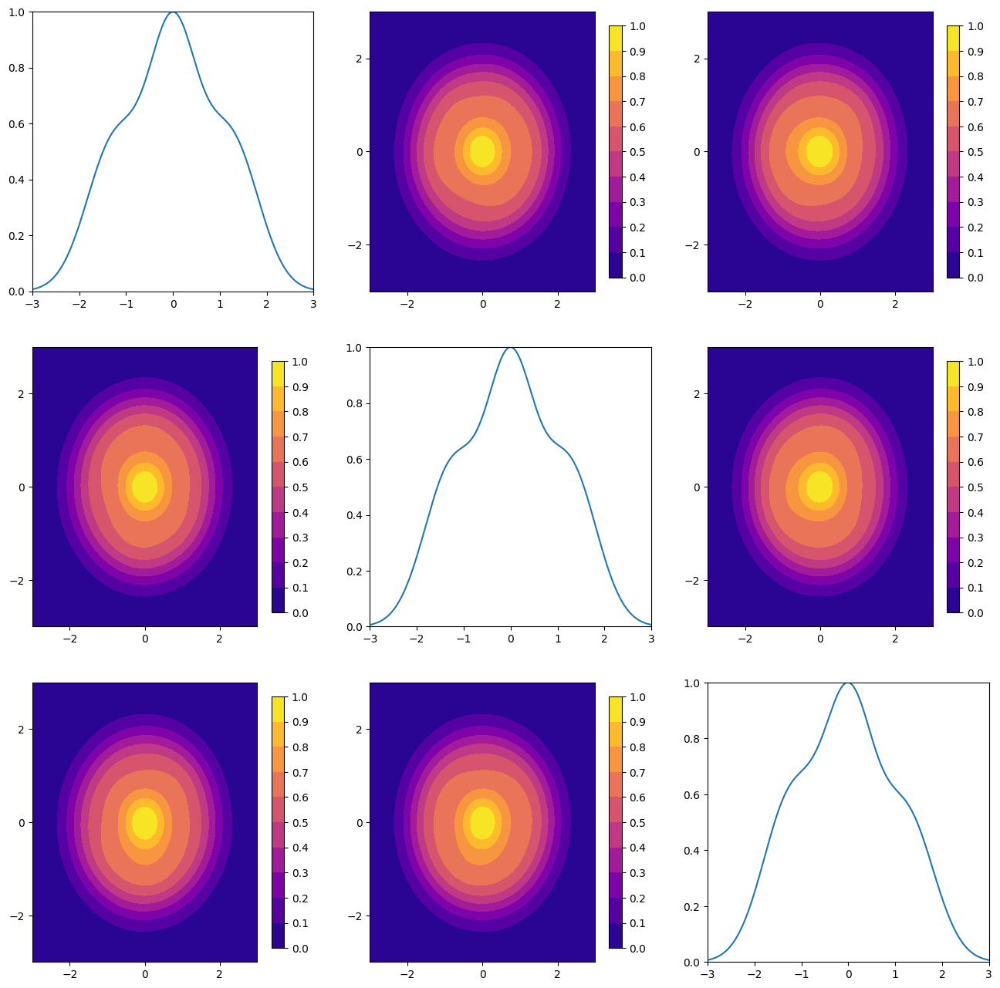

In [10]:
configTest = {
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 30,
        "number of hidden layers" : 5,
        "coordinate space dimension" : 3,
        "number of states" : 10,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 0.0,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 10.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    }


fig = footprintPlotWeightFunction(
    configTest, 
    "TEST_08:12:2023_3d_30L_5Nh_08Dec2023_18:06:11", 
    modelPath="../results/best/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_18:06:11.pt",
    states=np.arange(10)
)

Trial function with name TEST_09:12:2023_3d_30L_7Nh_09Dec2023_13:06:10 has been created


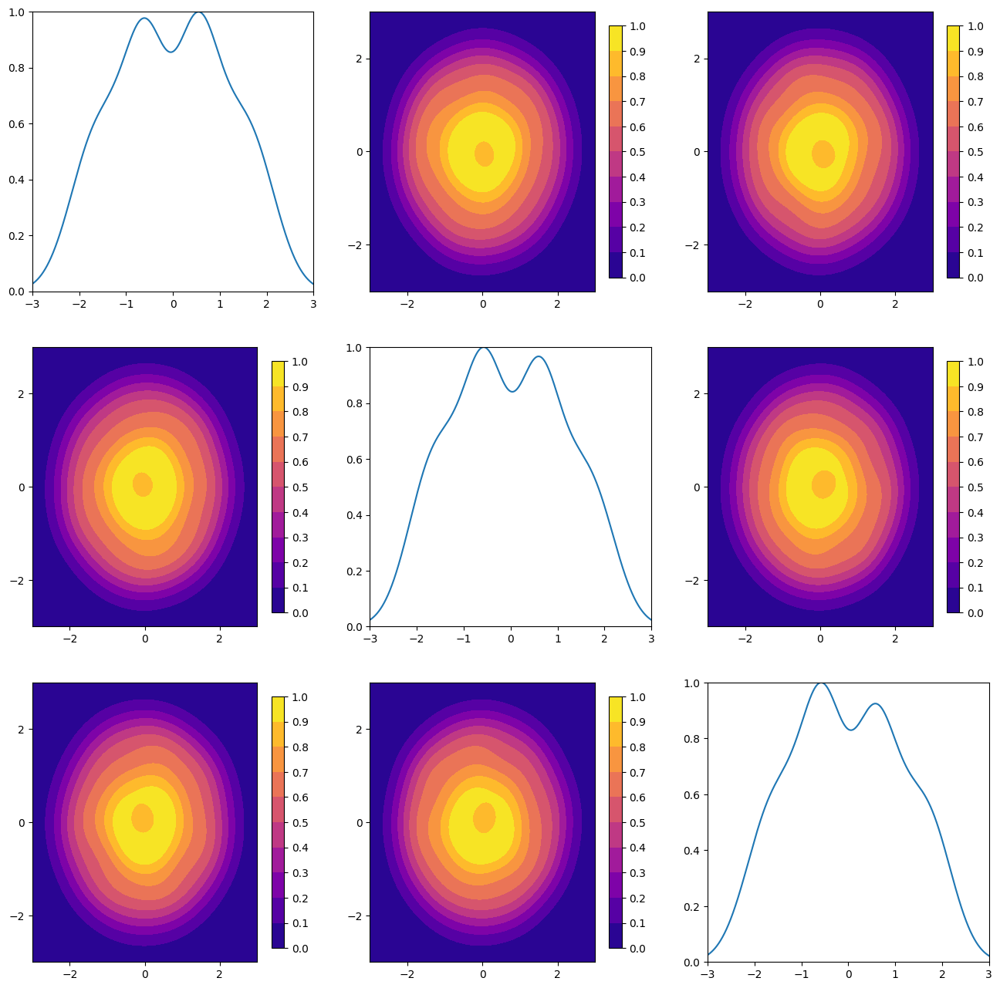

In [71]:
configTest = {
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 30,
        "number of hidden layers" : 7,
        "coordinate space dimension" : 3,
        "number of states" : 20,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 0.0,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 20.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    }
fig = footprintPlotWeightFunction(
    configTest, 
    "TEST_09:12:2023_3d_30L_7Nh_09Dec2023_13:06:10", 
    modelPath="../results/best/MODEL_TEST_09:12:2023_3d_30L_7Nh_09Dec2023_13:06:10.pt",
    states=np.arange(20)
)

In [180]:
ls ../results/MODEL_TEST_08:12:2023_*

../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_16:42:04.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_16:43:40.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_16:46:25.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_16:52:22.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_16:55:32.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_16:57:29.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_17:04:41.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_17:15:43.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_17:16:25.pt
../results/MODEL_TEST_08:12:2023_3d_30L_5Nh_08Dec2023_18:06:11.pt


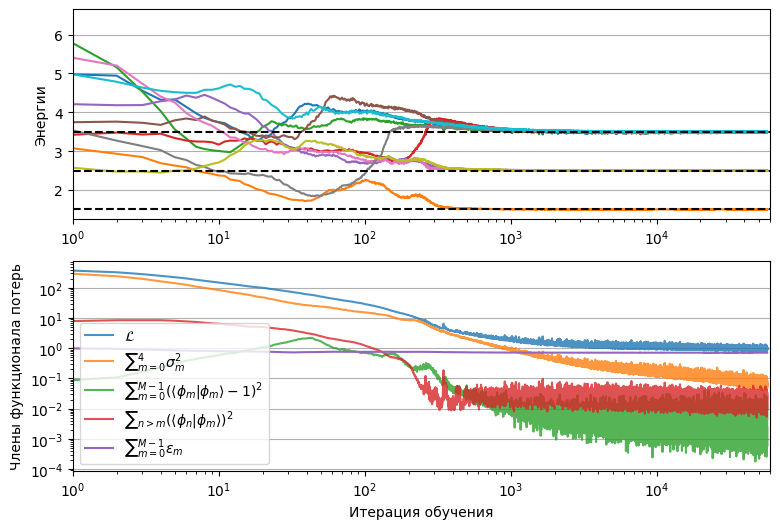

In [190]:
modelName = "TEST_08:12:2023_3d_30L_5Nh_08Dec2023_18:06:11"

hist = pd.read_csv("../results/hist_"+modelName+".csv")

fig, axes = plt.subplots(2, 1, figsize=(9,6))

numberOfStates = 10

hist[hist.columns[-numberOfStates:]].plot(ax=axes[0], xlim=(1,None), legend=False)
for y in [1.5,2.5,3.5]:
    axes[0].axhline(y=y, color='k', linestyle='--')
axes[0].grid(axis='y', which='both')
axes[0].minorticks_on
# axes[0].set_yscale("log")
axes[0].set_xscale("log")
axes[0].set_ylabel("Энергии")

labels=[r'$\mathcal{L}$',
        r'$\sum {}_{m=0}^4\sigma_m^2$', 
        r'$\sum {}_{m=0}^{M-1} ( \langle \phi_m | \phi_m \rangle - 1)^2$', 
        r'$\sum {}_{n>m} ( \langle \phi_n | \phi_m \rangle )^2$']

for i, col in enumerate(hist.columns[2:-numberOfStates]):
    plt.plot(hist[col].to_numpy(), alpha=0.8, label=labels[i])
axes[1].plot(hist[hist.columns[-numberOfStates:]].to_numpy().sum(axis=1)/hist[hist.columns[-numberOfStates:]].to_numpy().sum(axis=1)[0], label=r'$\sum {}_{m=0}^{M-1} \epsilon_m$')

# hist[hist.columns[2:-numberOfStates]].plot(ax=axes[1], xlim=(1,None), legend=True, alpha=0.8)
axes[1].legend()
axes[1].set_xlim(1,None)
axes[1].grid(axis='y')
axes[1].set_yscale("log")
axes[1].set_xscale("log")
axes[1].set_ylabel("Члены функционала потерь")
axes[1].set_xlabel("Итерация обучения")

# hist[-1:].transpose()

fig.savefig("../images/3d10m.png")

In [191]:
ls ../results/MODEL_TEST_09:12:2023*

../results/MODEL_TEST_09:12:2023_3d_30L_7Nh_09Dec2023_13:04:25.pt
../results/MODEL_TEST_09:12:2023_3d_30L_7Nh_09Dec2023_13:06:10.pt


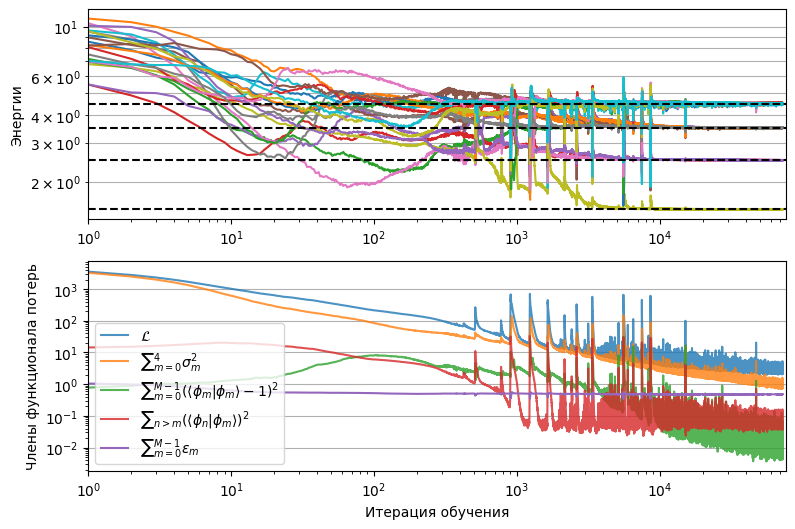

In [195]:
modelName = "TEST_09:12:2023_3d_30L_7Nh_09Dec2023_13:06:10"

hist = pd.read_csv("../results/hist_"+modelName+".csv")

fig, axes = plt.subplots(2, 1, figsize=(9,6))

numberOfStates = 20

hist[hist.columns[-numberOfStates:]].plot(ax=axes[0], xlim=(1,None), legend=False)
for y in [1.5,2.5,3.5,4.5]:
    axes[0].axhline(y=y, color='k', linestyle='--')
axes[0].grid(axis='y', which='both')
axes[0].minorticks_on
axes[0].set_yscale("log")
axes[0].set_xscale("log")
axes[0].set_ylabel("Энергии")

labels=[r'$\mathcal{L}$',
        r'$\sum {}_{m=0}^4\sigma_m^2$', 
        r'$\sum {}_{m=0}^{M-1} ( \langle \phi_m | \phi_m \rangle - 1)^2$', 
        r'$\sum {}_{n>m} ( \langle \phi_n | \phi_m \rangle )^2$']

for i, col in enumerate(hist.columns[2:-numberOfStates]):
    plt.plot(hist[col].to_numpy(), alpha=0.8, label=labels[i])
axes[1].plot(hist[hist.columns[-numberOfStates:]].to_numpy().sum(axis=1)/hist[hist.columns[-numberOfStates:]].to_numpy().sum(axis=1)[0], label=r'$\sum {}_{m=0}^{M-1} \epsilon_m$')

# hist[hist.columns[2:-numberOfStates]].plot(ax=axes[1], xlim=(1,None), legend=True, alpha=0.8)
axes[1].legend()
axes[1].set_xlim(1,None)
axes[1].grid(axis='y')
axes[1].set_yscale("log")
axes[1].set_xscale("log")
axes[1].set_ylabel("Члены функционала потерь")
axes[1].set_xlabel("Итерация обучения")

# hist[-1:].transpose()

fig.savefig("../images/3d20m.png")

Trial function with name TEST_09:12:2023_3d_30L_7Nh_09Dec2023_13:06:10 has been created
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


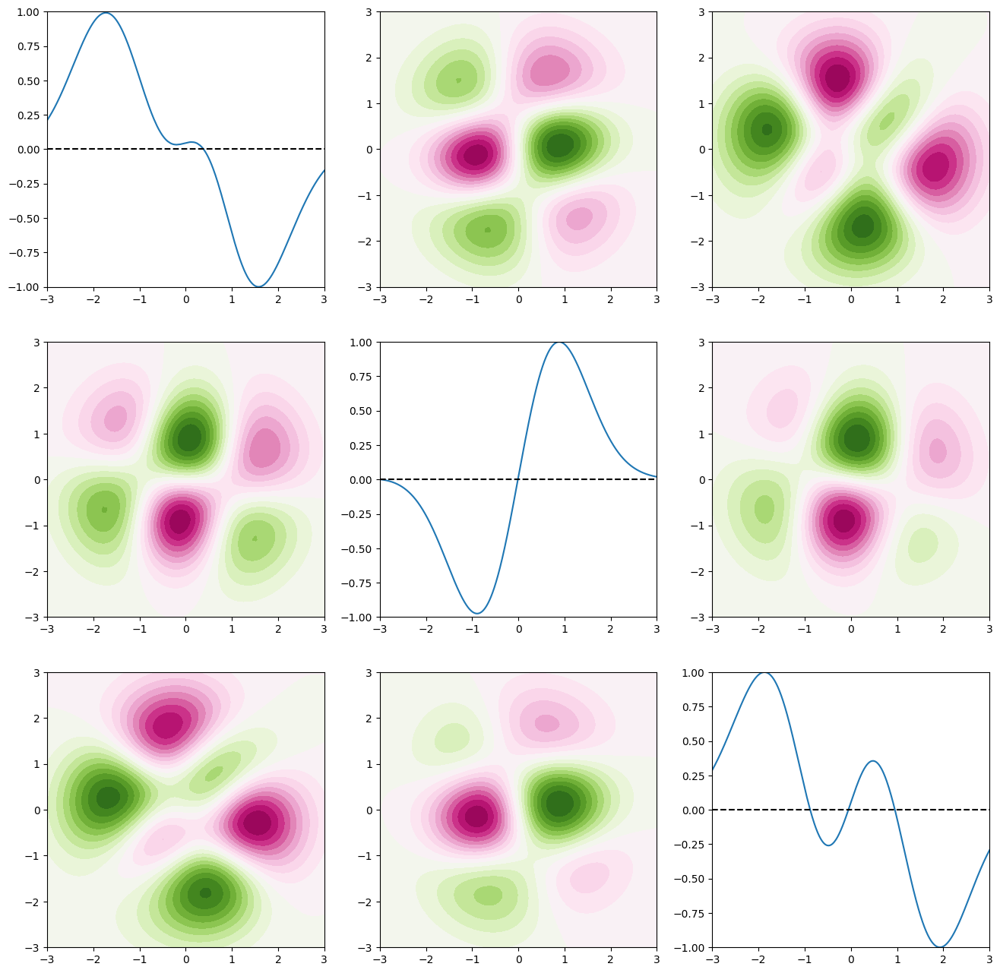

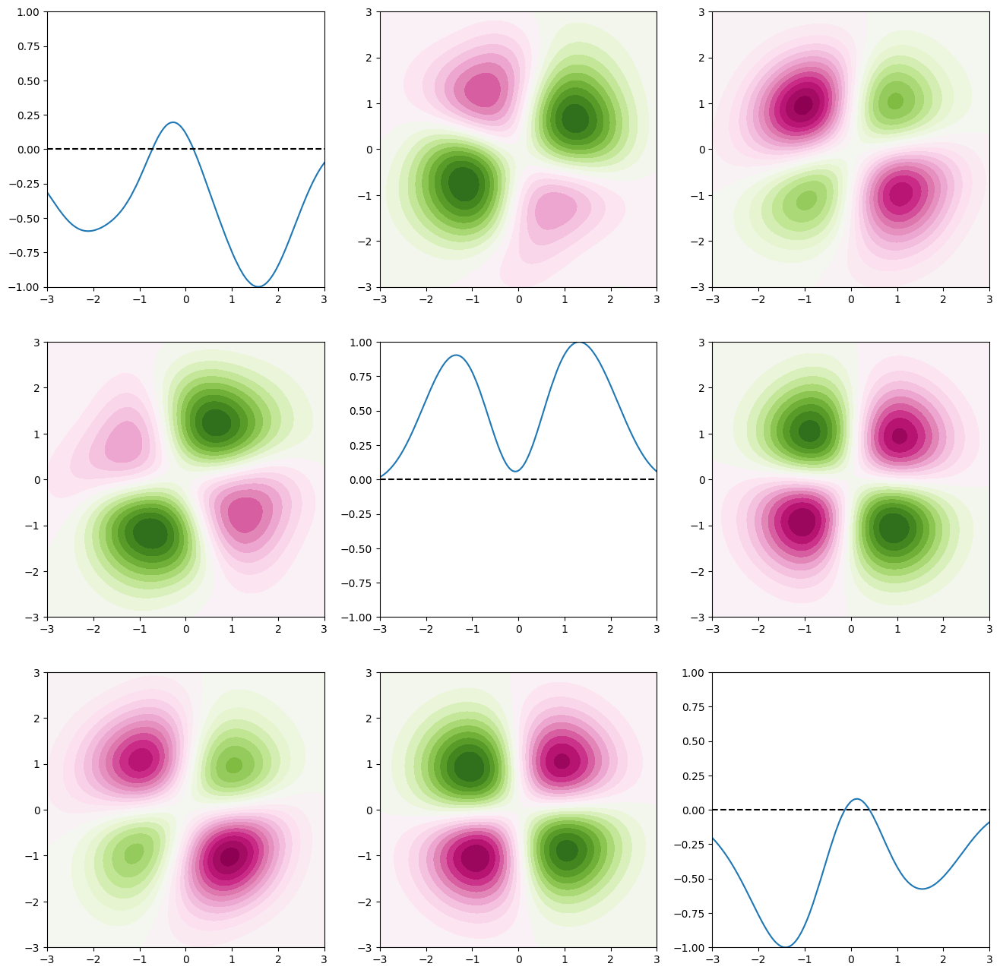

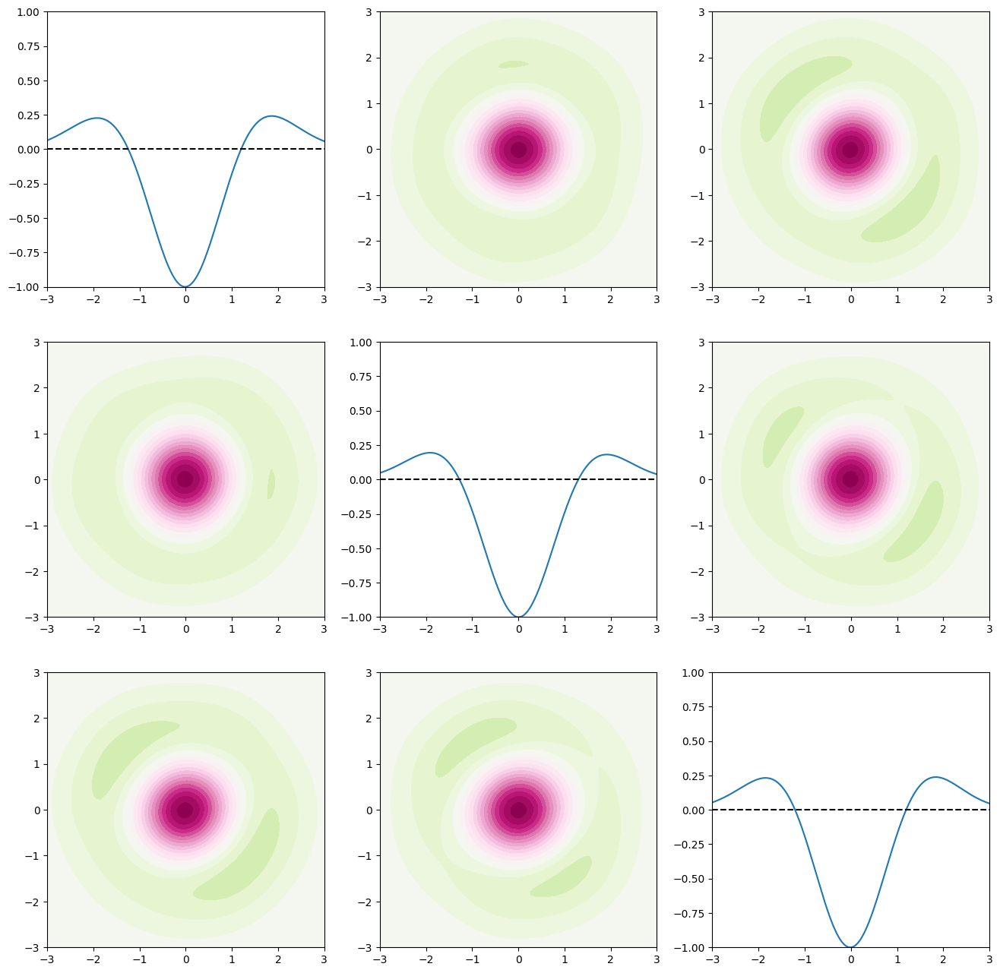

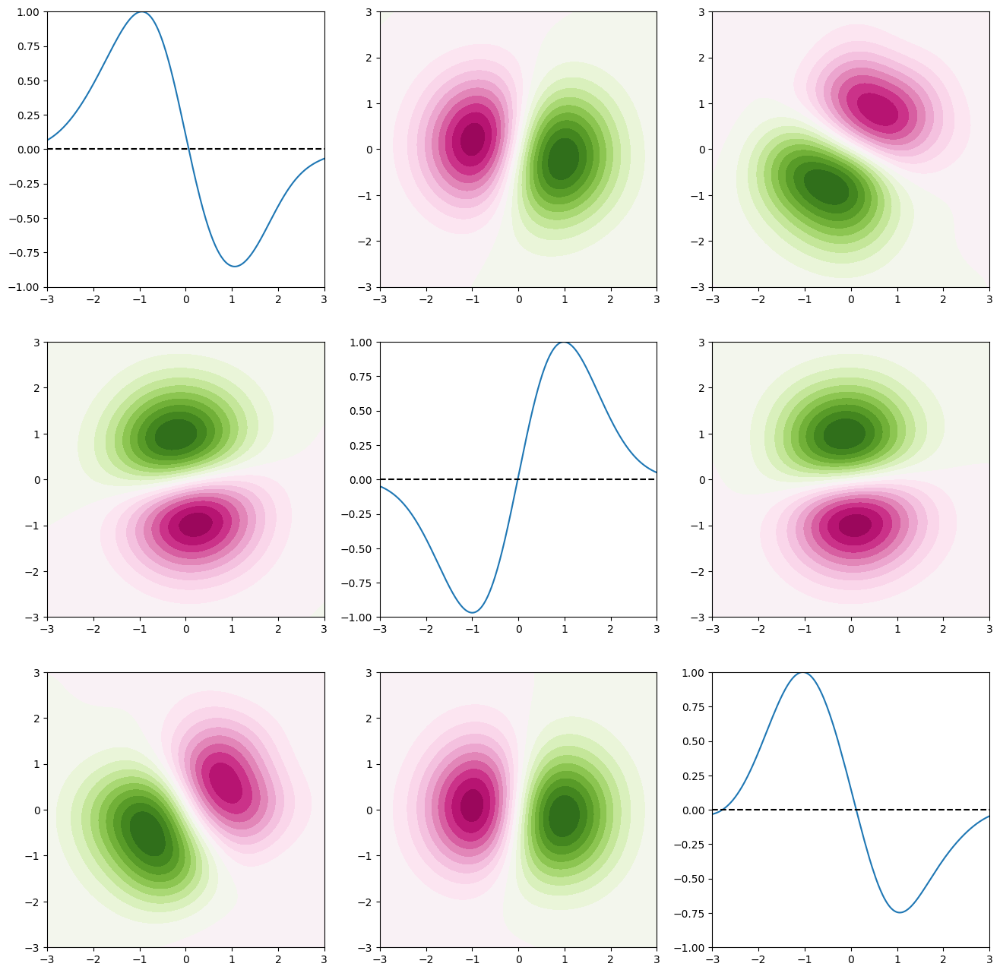

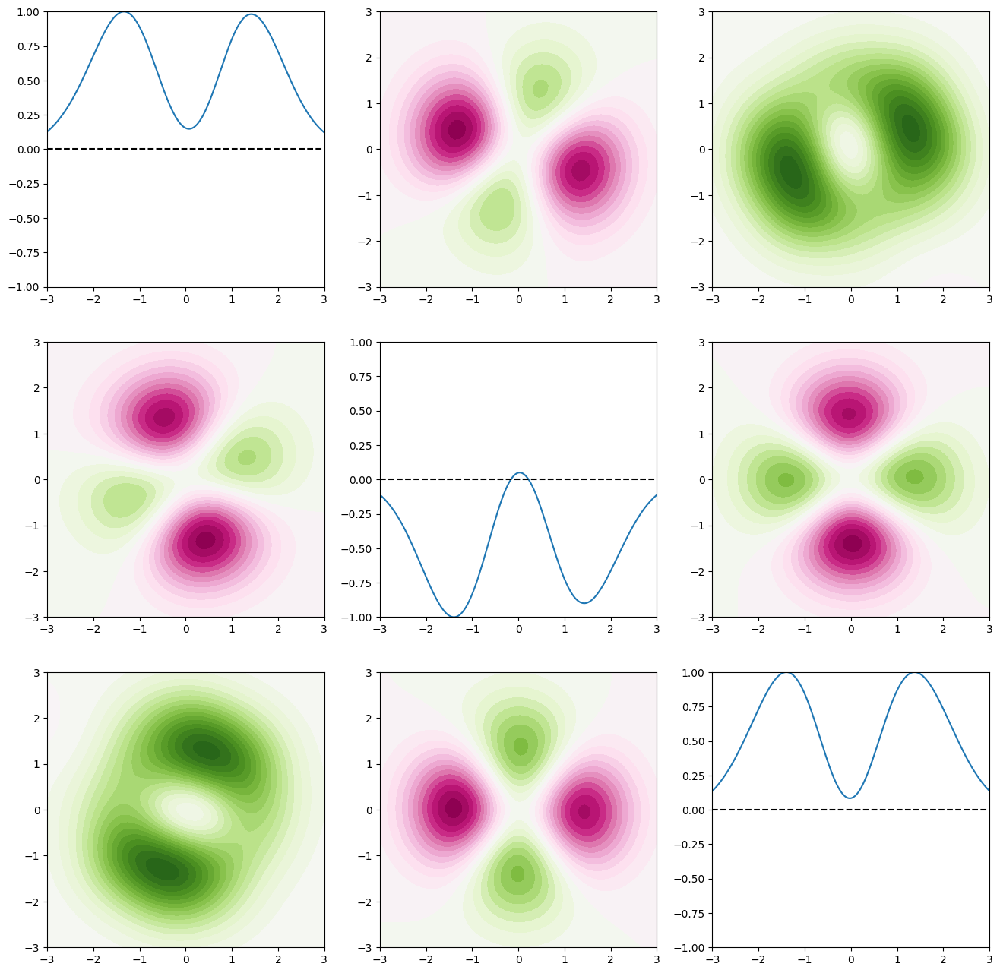

...

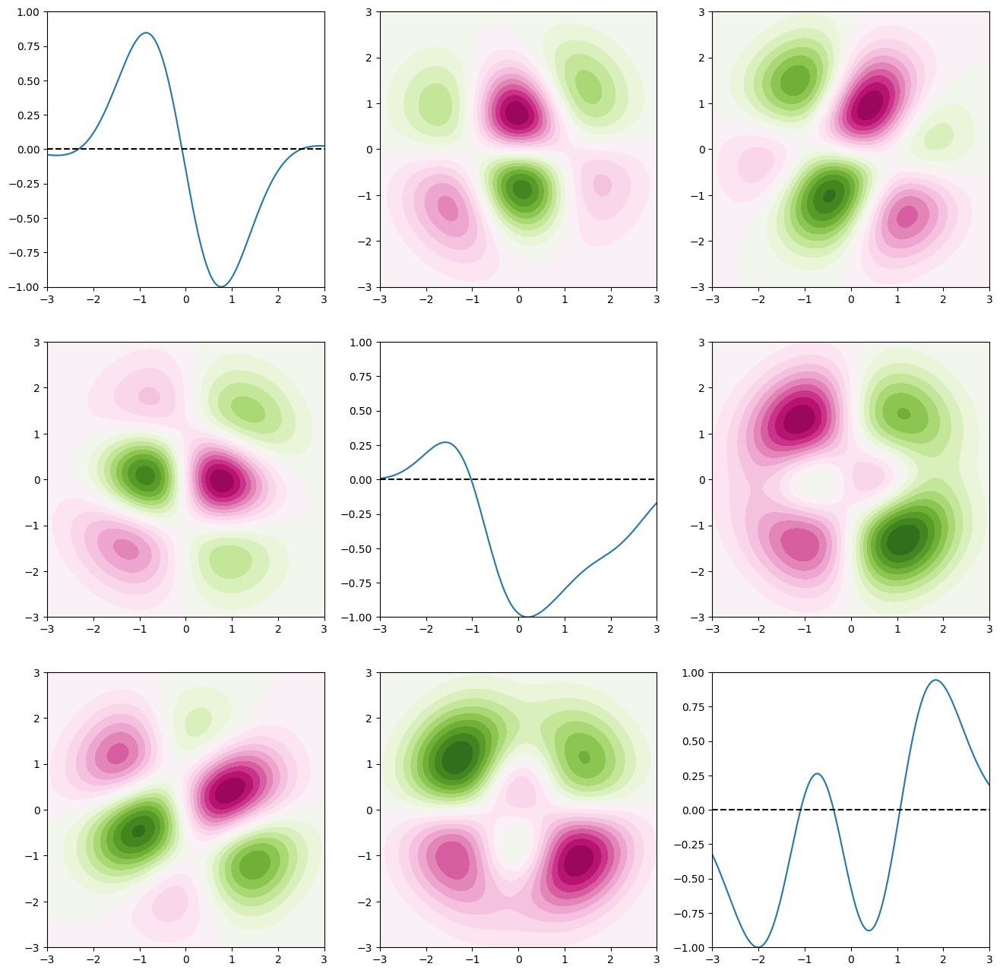

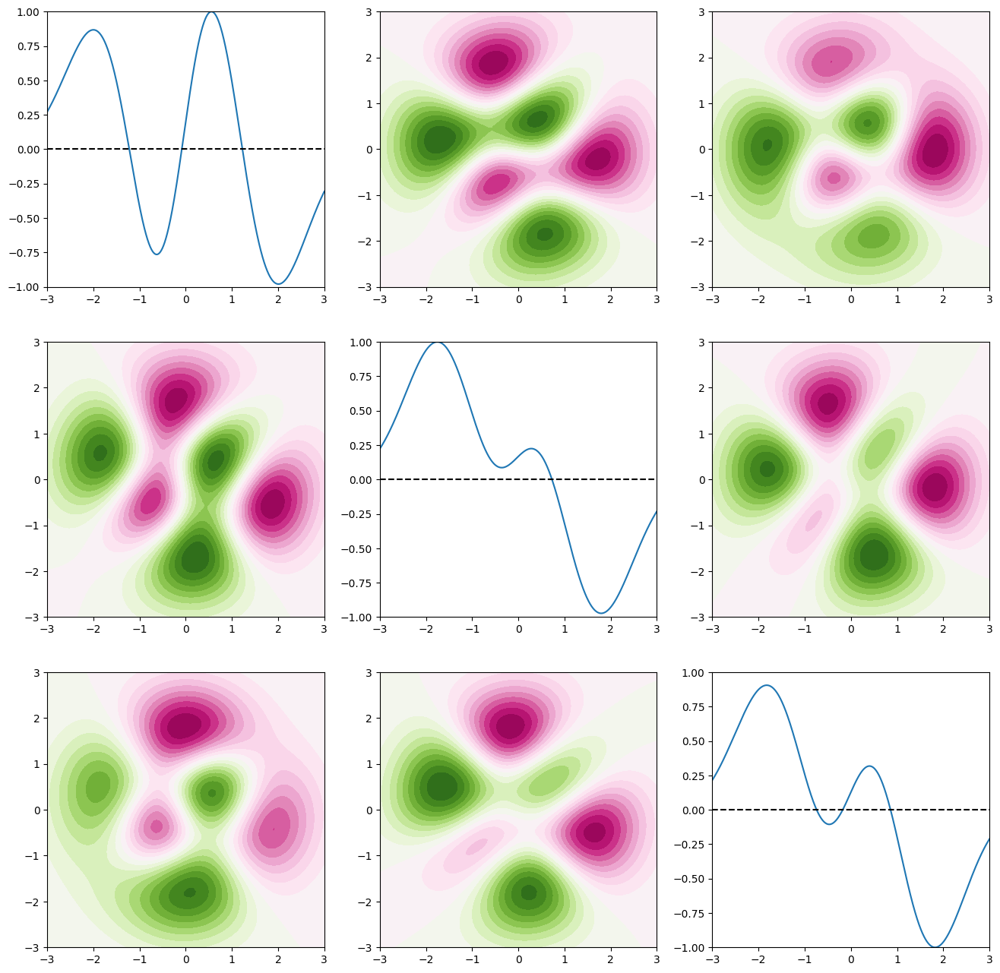

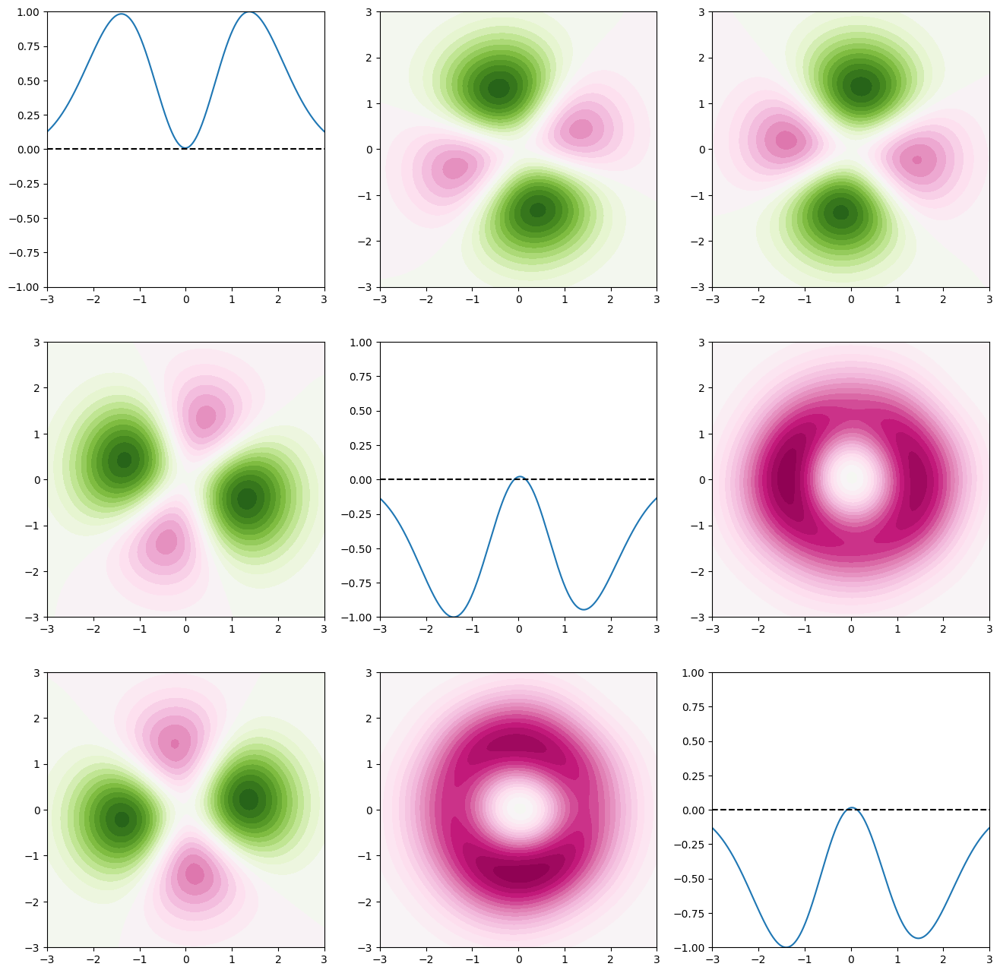

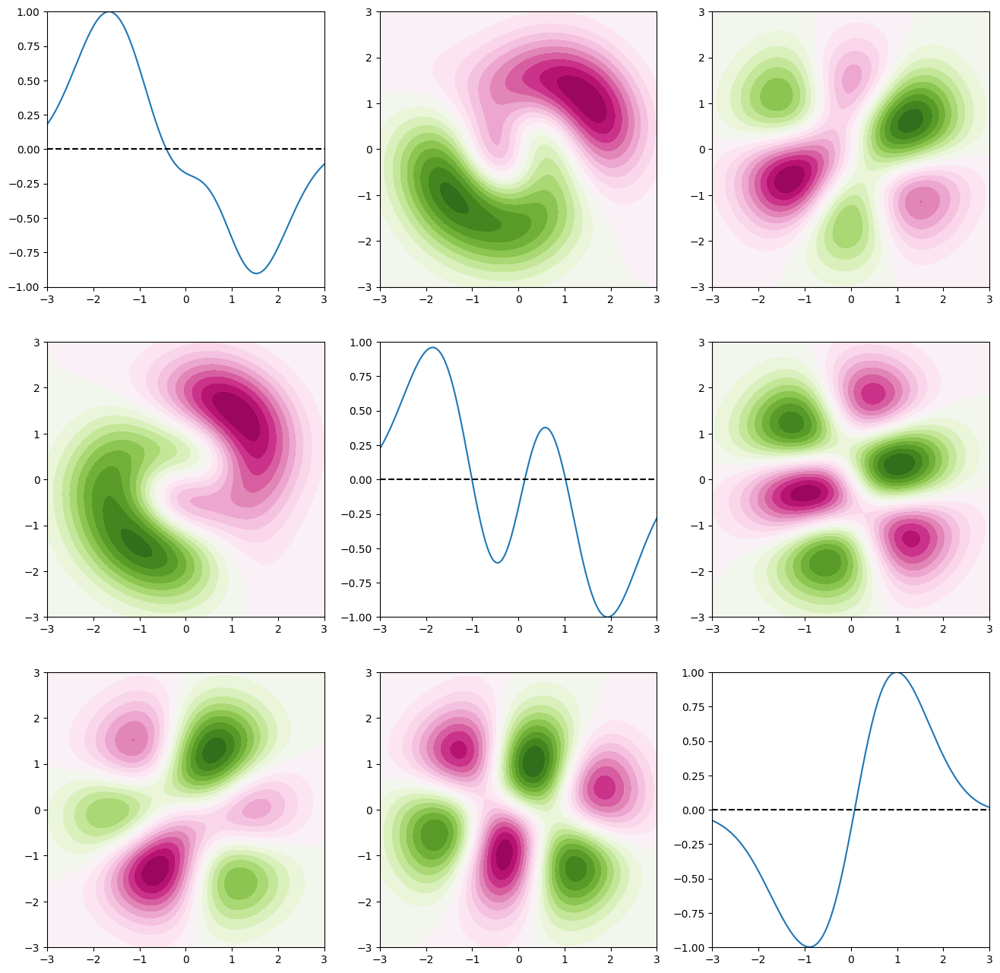

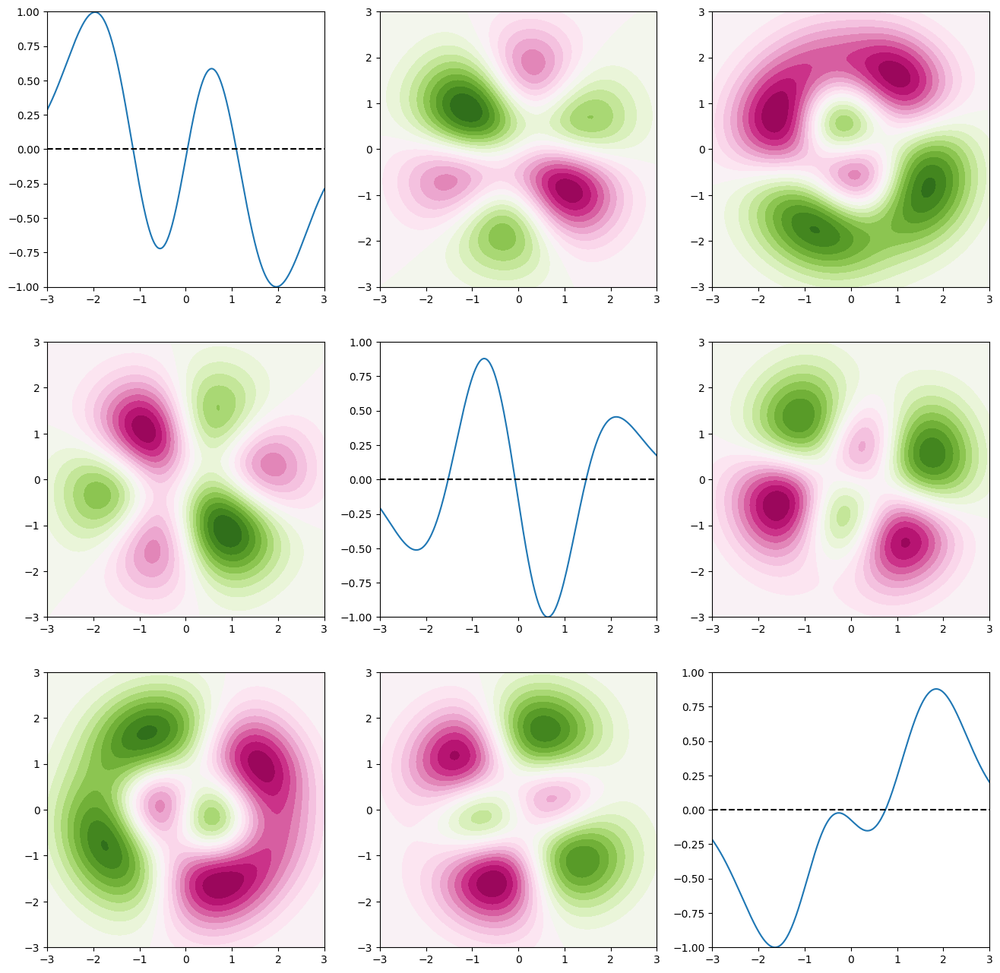

In [198]:
figs = footprintPlot(modelConfig={
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 30,
        "number of hidden layers" : 7,
        "coordinate space dimension" : 3,
        "number of states" : 20,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    }, modelName=modelName, modelPath="../results/MODEL_TEST_09:12:2023_3d_30L_7Nh_09Dec2023_13:06:10.pt", 
                     states=list(range(20)))

In [199]:
for m, fig in enumerate(figs):
    fig.savefig(f"../images/3d20m_best_{m}.png")

,10299
Unnamed: 0,10299.000000
time,2327.931159
tot loss,3.605417
sqr res,268.822235
norm dev,0.024016
in orthog dev,0.014053
e0,5.557290
e1,6.538095
e2,10.574160
e3,4.785765


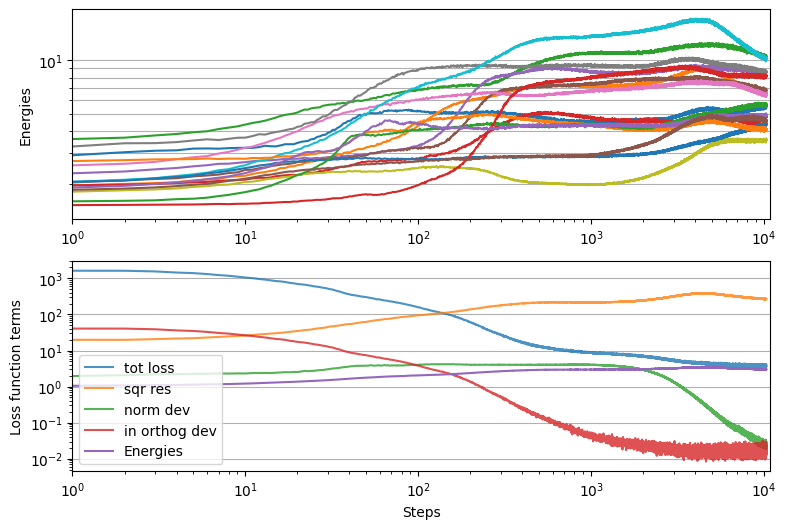

In [53]:
modelName = "TEST_4_16states_3d_30L_2Nh_23Dec2023_17:45:39" #"TEST_3_40states_3d_30L_10Nh_20Dec2023_19:31:00"

hist = pd.read_csv("../results/hist_"+modelName+".csv")

fig, axes = plt.subplots(2, 1, figsize=(9,6))

numberOfStates = 16

hist[hist.columns[-numberOfStates:]].plot(ax=axes[0], xlim=(1,None), legend=False)
axes[0].grid(axis='y', which='both')
axes[0].minorticks_on
axes[0].set_yscale("log")
axes[0].set_xscale("log")
axes[0].set_ylabel("Energies")
# axes[0].set_xlim(1e3,None)
# axes[0].set_ylim(1,10)

hist[hist.columns[2:-numberOfStates]].plot(ax=axes[1], xlim=(1,None), legend=True, alpha=0.8)
axes[1].plot(hist[hist.columns[-numberOfStates:]].to_numpy().sum(axis=1)/hist[hist.columns[-numberOfStates:]].to_numpy().sum(axis=1)[0], label='Energies')
axes[1].legend()
axes[1].grid(axis='y')
axes[1].set_yscale("log")
axes[1].set_xscale("log")
axes[1].set_ylabel("Loss function terms")
axes[1].set_xlabel("Steps")
# axes[1].set_xlim(1e3,None)

hist[-1:].transpose()

In [50]:
ls ../results/hist_TEST_3_40states*

../results/hist_TEST_3_40states_1_3d_30L_10Nh_13Dec2023_10:12:22.csv
../results/hist_TEST_3_40states_1_3d_30L_10Nh_13Dec2023_10:37:23.csv
../results/hist_TEST_3_40states_1_3d_30L_10Nh_13Dec2023_10:46:56.csv
../results/hist_TEST_3_40states_1_3d_30L_10Nh_13Dec2023_10:53:15.csv
../results/hist_TEST_3_40states_3d_30L_10Nh_12Dec2023_20:48:06.csv


In [177]:
ls ../results/TEST_08*

ls: cannot access '../results/TEST_08*': No such file or directory


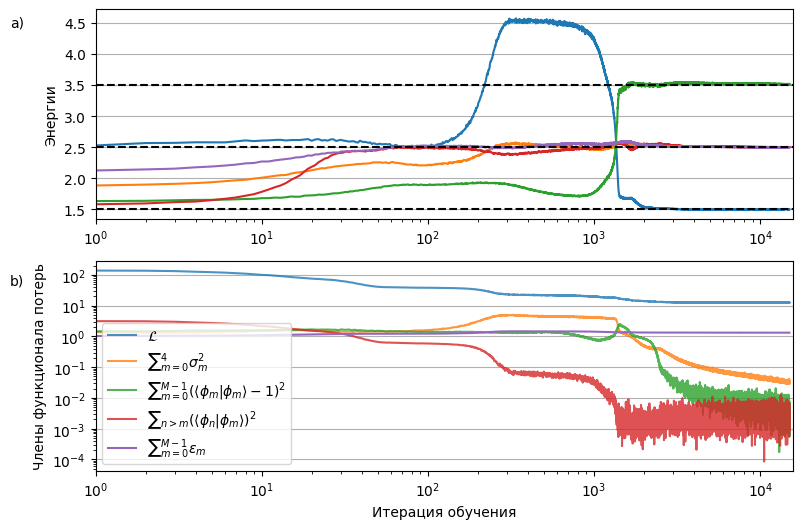

In [146]:
name = "L20_Nh1_21Oct2023_23:33:11"

timeHistory_1 = pd.read_csv("../loss/time_3d_"+name+".csv")
lossHistory_1 = pd.read_csv("../loss/loss_3d_"+name+".csv")
eHistory_1 = pd.read_csv("../loss/e_3d_"+name+".csv")

fig, axes = plt.subplots(2, 1, figsize=(9,6))

numberOfStates = 16

eHistory_1[eHistory_1.columns[1:]].plot(ax=axes[0], xlim=(1,None), legend=False)
axes[0].grid(axis='y', which='both')
for y in [1.5,2.5,3.5]:
    axes[0].axhline(y=y, color='k', linestyle='--')
axes[0].minorticks_on
# axes[0].set_yscale("log")
axes[0].set_xscale("log")
axes[0].set_ylabel("Энергии")
# axes[0].set_xlim(1e3,None)
# axes[0].set_ylim(1,10)

labels=[r'$\mathcal{L}$',
        r'$\sum {}_{m=0}^4\sigma_m^2$', 
        r'$\sum {}_{m=0}^{M-1} ( \langle \phi_m | \phi_m \rangle - 1)^2$', 
        r'$\sum {}_{n>m} ( \langle \phi_n | \phi_m \rangle )^2$']

for i, col in enumerate(lossHistory_1.columns[1:]):
    plt.plot(lossHistory_1[col].to_numpy(), alpha=0.8, label=labels[i])

axes[1].set_xlim(1,None)
axes[1].legend()
axes[1].plot(eHistory_1[eHistory_1.columns[1:]].to_numpy().sum(axis=1)/eHistory_1[eHistory_1.columns[1:]].to_numpy().sum(axis=1)[0], label=r'$\sum {}_{m=0}^{M-1} \epsilon_m$')
axes[1].legend()
axes[1].grid(axis='y')
axes[1].set_yscale("log")
axes[1].set_xscale("log")
axes[1].set_ylabel("Члены функционала потерь")
axes[1].set_xlabel("Итерация обучения")

plt.figtext(0.03,0.85,"a)")
plt.figtext(0.03,0.42,"b)")

fig.savefig("../images/3d5m_best.png")

Trial function with name 3d_L20_Nh1_21Oct2023_23:33:11 has been created
Trial function with name 3d_L20_Nh1_21Oct2023_23:33:11 has been created
0
1
2
3
4


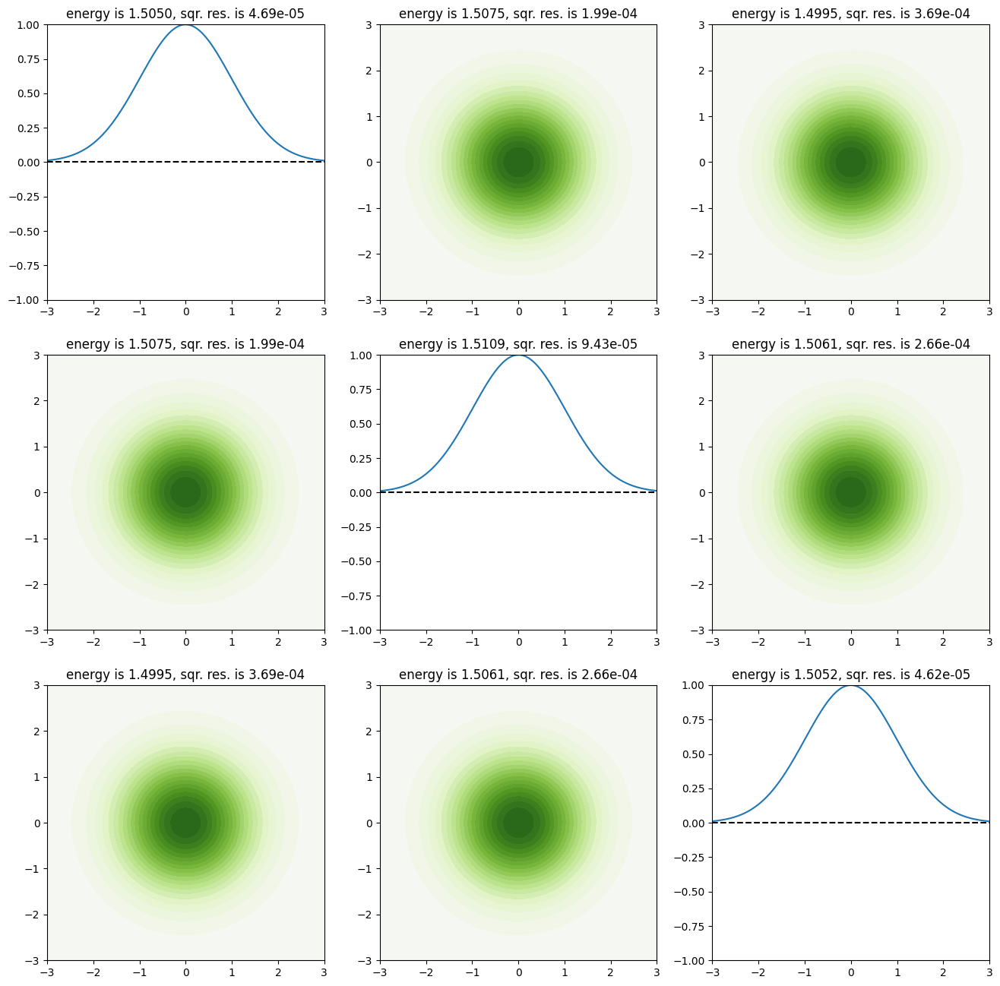

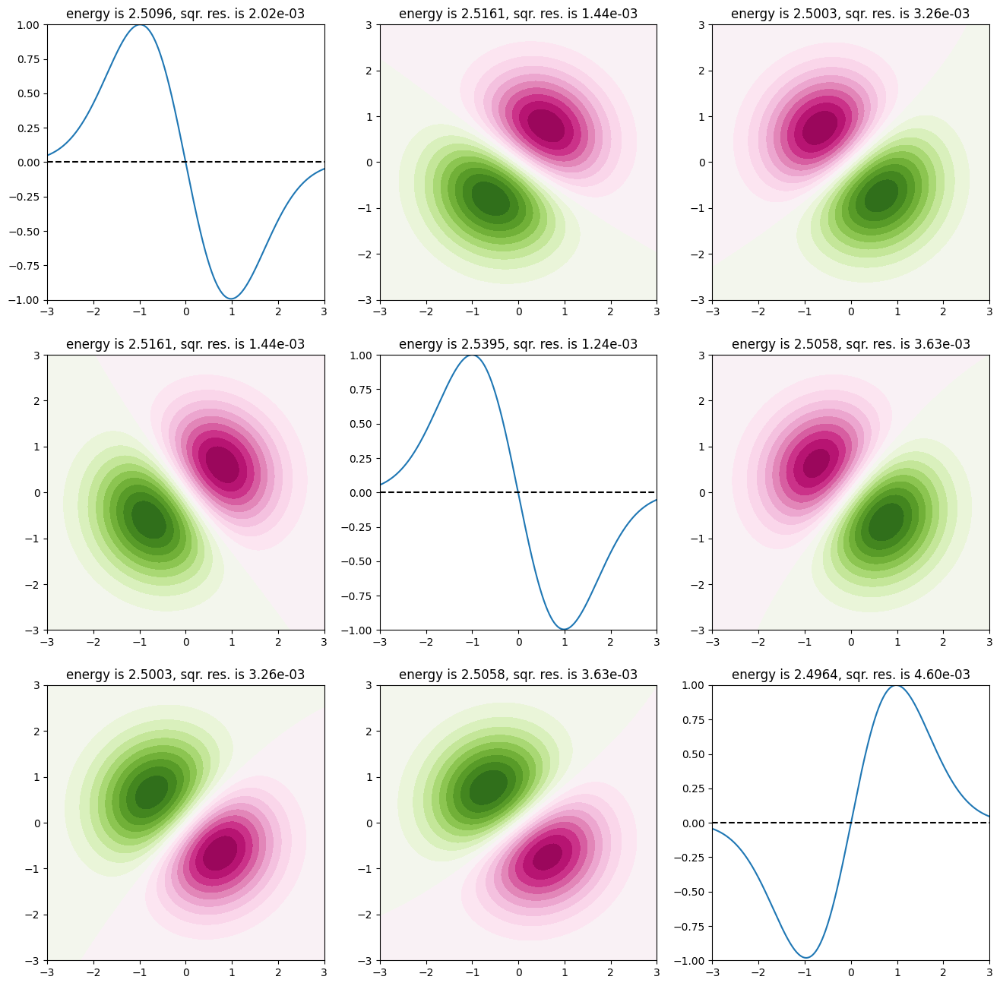

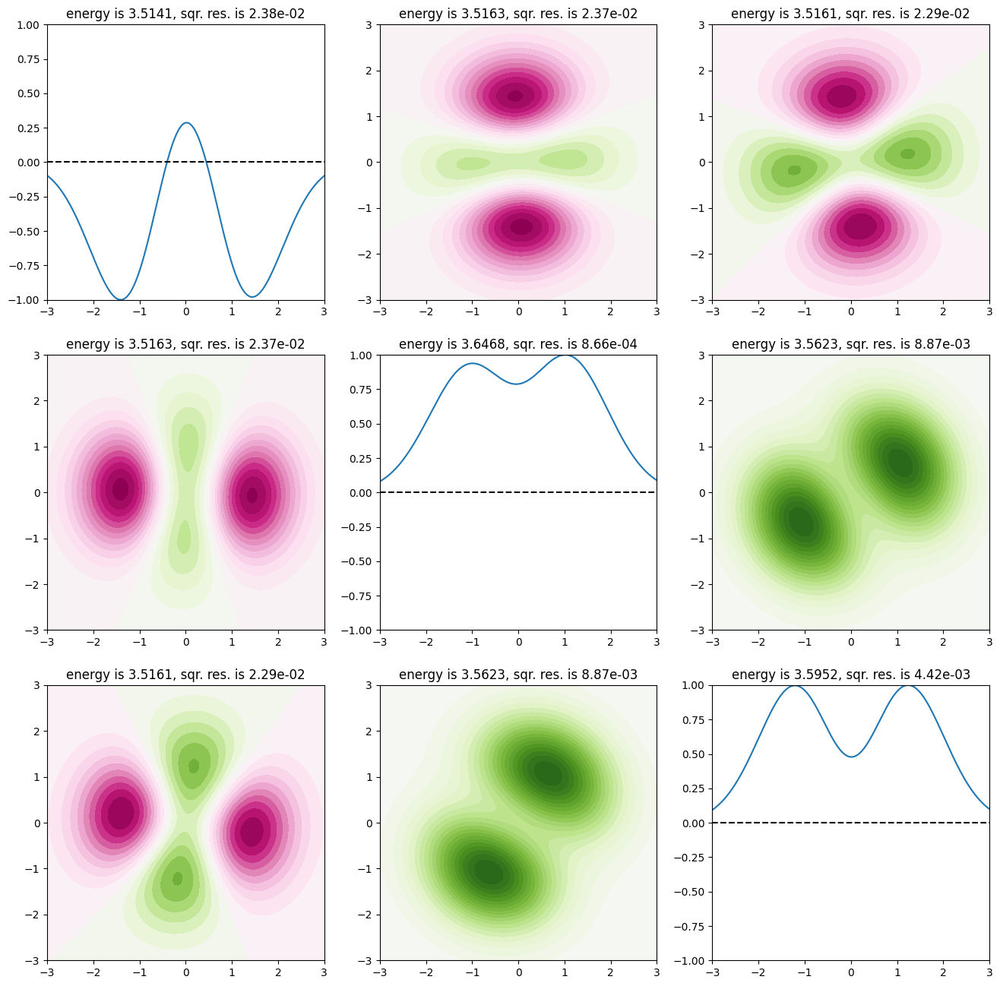

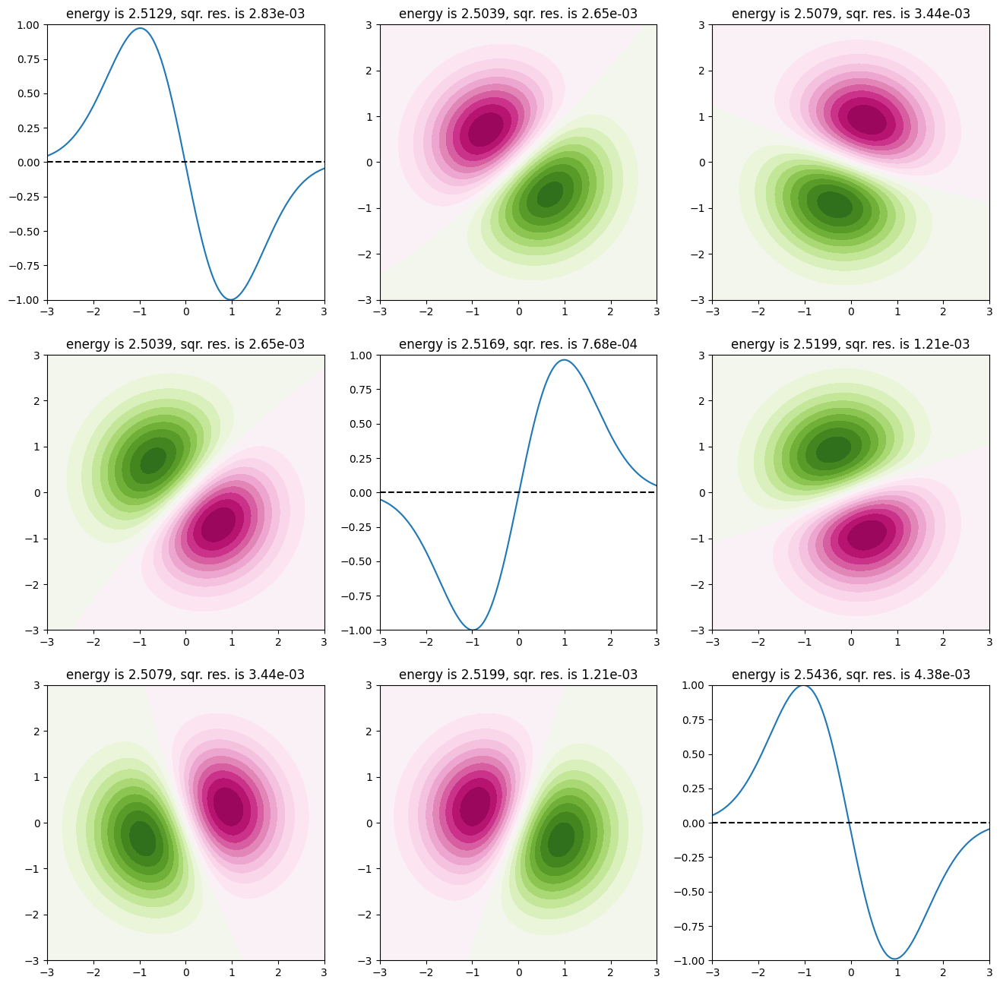

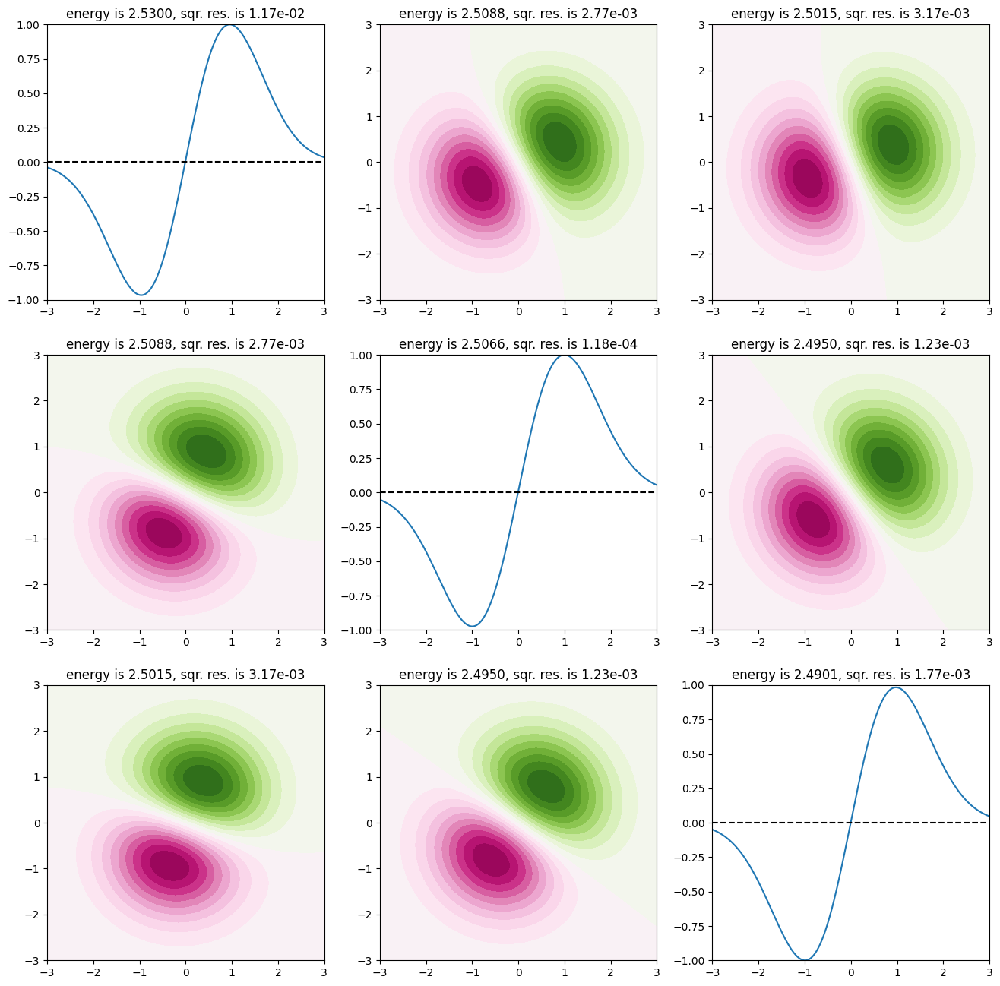

In [106]:
name = "L20_Nh1_21Oct2023_23:33:11"

trialFunction_3D = TrialFunction(
    {
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 20,
        "number of hidden layers" : 1,
        "coordinate space dimension" : 3,
        "number of states" : 5,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    },
    "3d_"+name
)

figs = footprintPlot(modelConfig={
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 20,
        "number of hidden layers" : 1,
        "coordinate space dimension" : 3,
        "number of states" : 5,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    }, modelName="3d_"+name, modelPath=trialFunction_3D.PATH, states=[0,1,2,3,4])

In [145]:
for m, fig in enumerate(figs):
    fig.savefig(f"../images/3d5m_best_{m}.png")

# OPTUNA TRIALS

In [11]:
ls ../optuna_trials/

3d_stdsqrt01.csv           3d_test.csv       5d_stdsqrt01.csv
3d_stdsqrt01_35states.csv  4d_stdsqrt01.csv


## 3D 5M

In [98]:
trials = pd.read_csv("../optuna_trials/3d_stdsqrt01.csv")

/tmp/ipykernel_1674/131666319.py:41: RuntimeWarning: Mean of empty slice.
  ]['value'].to_numpy().mean()
/home/akozlov/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


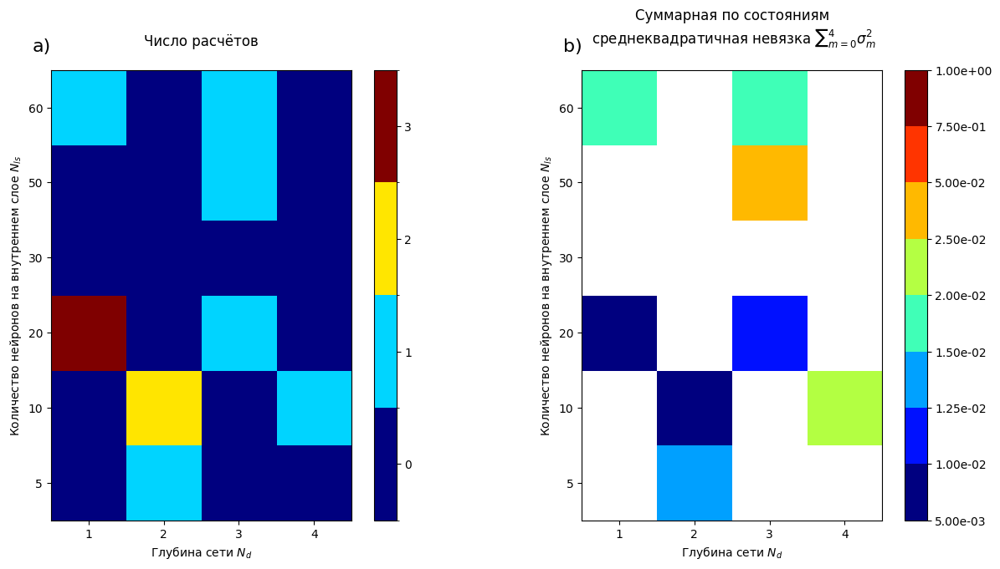

In [147]:
fig, ax = plt.subplots(1, 2, figsize=(15,7))

hiddenLayerSizes = [5,10,20,30,50,60]
numbersOfHiddenLayers = [1,2,3,4]

ax[0].set_title("Число расчётов"+"\n")

numberOfCompilations = np.full((6,4), 0.0)
for i, hiddenLayerSize in enumerate(hiddenLayerSizes):
    for j, numberOfHiddenLayers in enumerate(numbersOfHiddenLayers):
        amount = len(
            trials[
            (trials['state']=='COMPLETE')
            *(trials['params_hidden layer size']==hiddenLayerSize)
            *(trials['params_number of hidden layers']==numberOfHiddenLayers)
            ]
        )
        if amount > 0:
            numberOfCompilations[i,j] = len(trials[
                (trials['state']=='COMPLETE')
                *(trials['params_hidden layer size']==hiddenLayerSize)
                *(trials['params_number of hidden layers']==numberOfHiddenLayers)
                ]
            )

pcol1 = ax[0].imshow(numberOfCompilations, cmap='jet', origin='lower', norm=colors.BoundaryNorm(boundaries=[-0.5,0.5,1.5,2.5,3.5], ncolors=256),)
ax[0].set_yticks(np.arange(len(hiddenLayerSizes)), labels=hiddenLayerSizes)
ax[0].set_ylabel(r'Количество нейронов на внутреннем слое $N_{ls}$')
ax[0].set_xticks(np.arange(len(numbersOfHiddenLayers)), labels=numbersOfHiddenLayers)
ax[0].set_xlabel(r'Глубина сети $N_d$')
cbar1 = plt.colorbar(pcol1, ticks=[0,1,2,3])

ax[1].set_title("Суммарная по состояниям\n среднеквадратичная "+"невязка $\sum {}_{m=0}^{4} \sigma^2_m$"+"\n")
finalResults = np.zeros((6,4))
for i, hiddenLayerSize in enumerate(hiddenLayerSizes):
    for j, numberOfHiddenLayers in enumerate(numbersOfHiddenLayers):
        finalResults[i,j] = trials[
            (trials['state']=='COMPLETE')
            *(trials['params_hidden layer size']==hiddenLayerSize)
            *(trials['params_number of hidden layers']==numberOfHiddenLayers)
            ]['value'].to_numpy().mean()
bounds = [0.005,0.01,0.0125,0.015,0.02,0.025,0.05,0.75,1]
im2 = ax[1].imshow(
    finalResults,
    cmap='jet',
    norm=colors.BoundaryNorm(boundaries=bounds, ncolors=256),
    origin='lower'
)
ax[1].set_yticks(np.arange(len(hiddenLayerSizes)), labels=hiddenLayerSizes)
ax[1].set_ylabel(r'Количество нейронов на внутреннем слое $N_{ls}$')
ax[1].set_xticks(np.arange(len(numbersOfHiddenLayers)), labels=numbersOfHiddenLayers)
ax[1].set_xlabel(r'Глубина сети $N_d$')
cbar2 = plt.colorbar(im2, ticks=bounds)
cbar2.set_ticklabels([f"{b:.2e}" for b in bounds])

# fig.subplots_adjust(wspace=0.)

ax[0].text(-0.75,5.75,"a)", fontsize=16)
ax[1].text(-0.75,5.75,"b)", fontsize=16)

fig.savefig("../images/3d5m.png")

In [100]:
trials[trials['value'] == trials['value'].min()]

,Unnamed: 0,number,value,datetime_start,datetime_complete,duration,params_hidden layer size,params_number of hidden layers,state
17,17,17,0.00703,2023-10-22 02:33:11.780521,2023-10-22 03:17:25.372150,0 days 00:44:13.591629,20,1,COMPLETE


In [104]:
ls ../models/3d_L20*

../models/3d_L20_Nh1_21Oct2023_20:07:18.pt
../models/3d_L20_Nh1_21Oct2023_22:09:35.pt
../models/3d_L20_Nh1_21Oct2023_23:33:11.pt
../models/3d_L20_Nh3_21Oct2023_17:39:41.pt


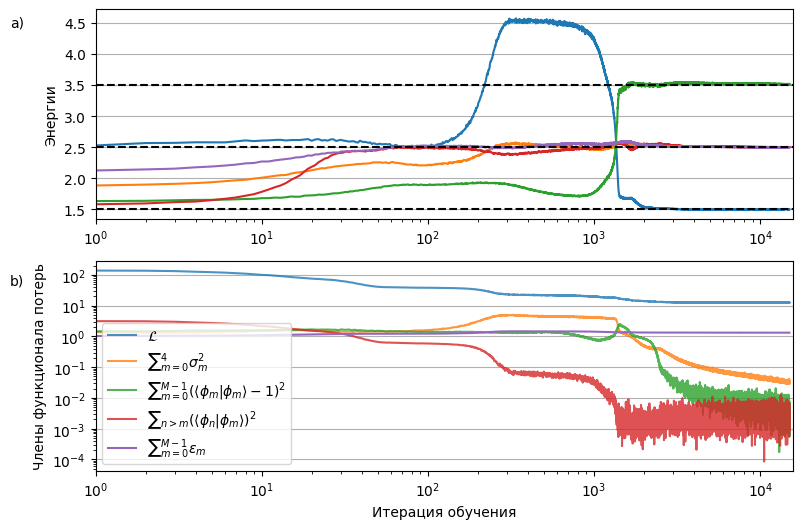

In [146]:
name = "L20_Nh1_21Oct2023_23:33:11"

timeHistory_1 = pd.read_csv("../loss/time_3d_"+name+".csv")
lossHistory_1 = pd.read_csv("../loss/loss_3d_"+name+".csv")
eHistory_1 = pd.read_csv("../loss/e_3d_"+name+".csv")

fig, axes = plt.subplots(2, 1, figsize=(9,6))

numberOfStates = 16

eHistory_1[eHistory_1.columns[1:]].plot(ax=axes[0], xlim=(1,None), legend=False)
axes[0].grid(axis='y', which='both')
for y in [1.5,2.5,3.5]:
    axes[0].axhline(y=y, color='k', linestyle='--')
axes[0].minorticks_on
# axes[0].set_yscale("log")
axes[0].set_xscale("log")
axes[0].set_ylabel("Энергии")
# axes[0].set_xlim(1e3,None)
# axes[0].set_ylim(1,10)

labels=[r'$\mathcal{L}$',
        r'$\sum {}_{m=0}^4\sigma_m^2$', 
        r'$\sum {}_{m=0}^{M-1} ( \langle \phi_m | \phi_m \rangle - 1)^2$', 
        r'$\sum {}_{n>m} ( \langle \phi_n | \phi_m \rangle )^2$']

for i, col in enumerate(lossHistory_1.columns[1:]):
    plt.plot(lossHistory_1[col].to_numpy(), alpha=0.8, label=labels[i])

axes[1].set_xlim(1,None)
axes[1].legend()
axes[1].plot(eHistory_1[eHistory_1.columns[1:]].to_numpy().sum(axis=1)/eHistory_1[eHistory_1.columns[1:]].to_numpy().sum(axis=1)[0], label=r'$\sum {}_{m=0}^{M-1} \epsilon_m$')
axes[1].legend()
axes[1].grid(axis='y')
axes[1].set_yscale("log")
axes[1].set_xscale("log")
axes[1].set_ylabel("Члены функционала потерь")
axes[1].set_xlabel("Итерация обучения")

plt.figtext(0.03,0.85,"a)")
plt.figtext(0.03,0.42,"b)")

fig.savefig("../images/3d5m_best.png")

Trial function with name 3d_L20_Nh1_21Oct2023_23:33:11 has been created
Trial function with name 3d_L20_Nh1_21Oct2023_23:33:11 has been created
0
1
2
3
4


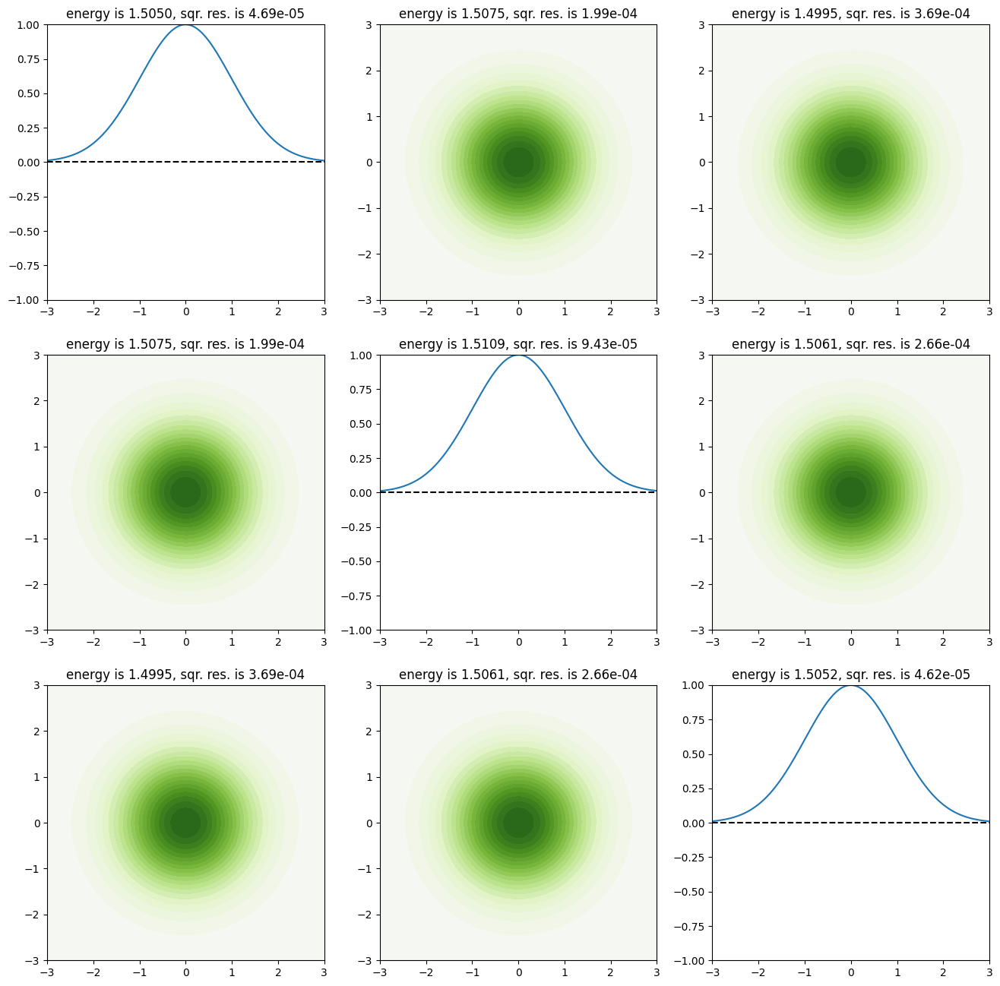

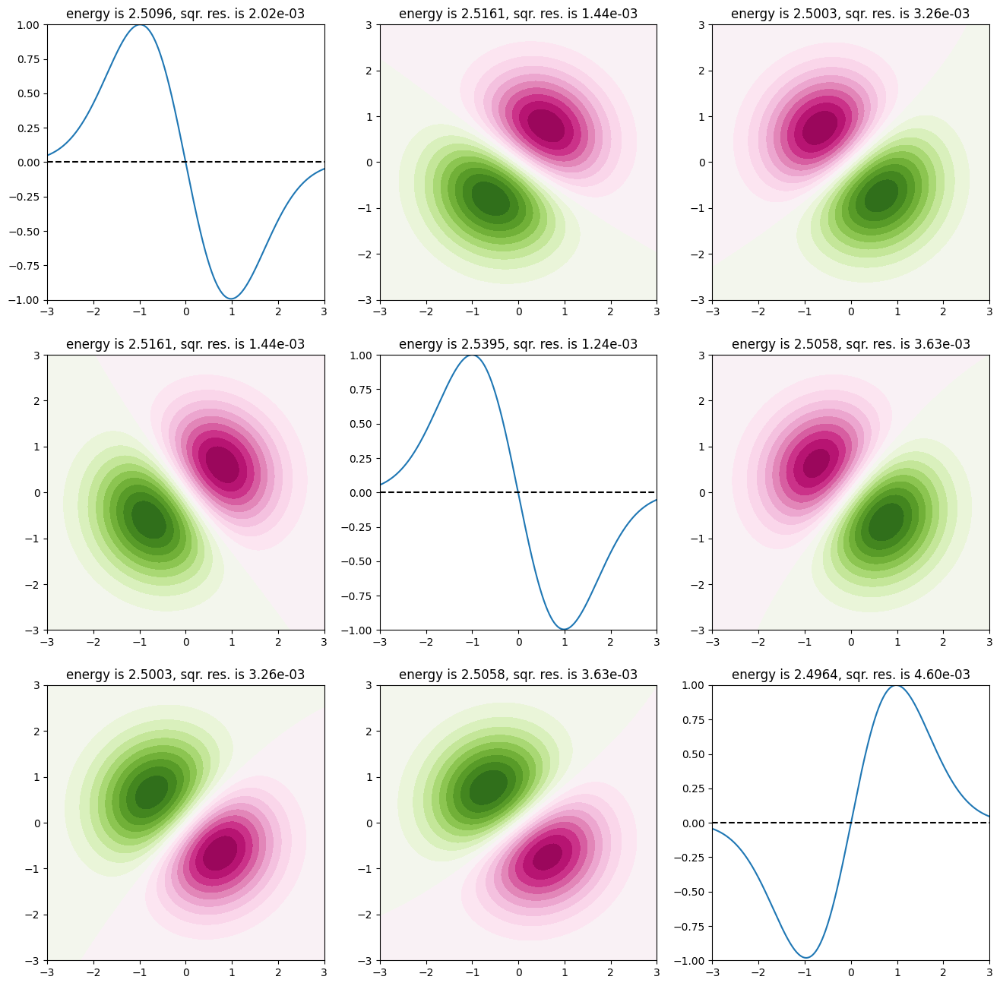

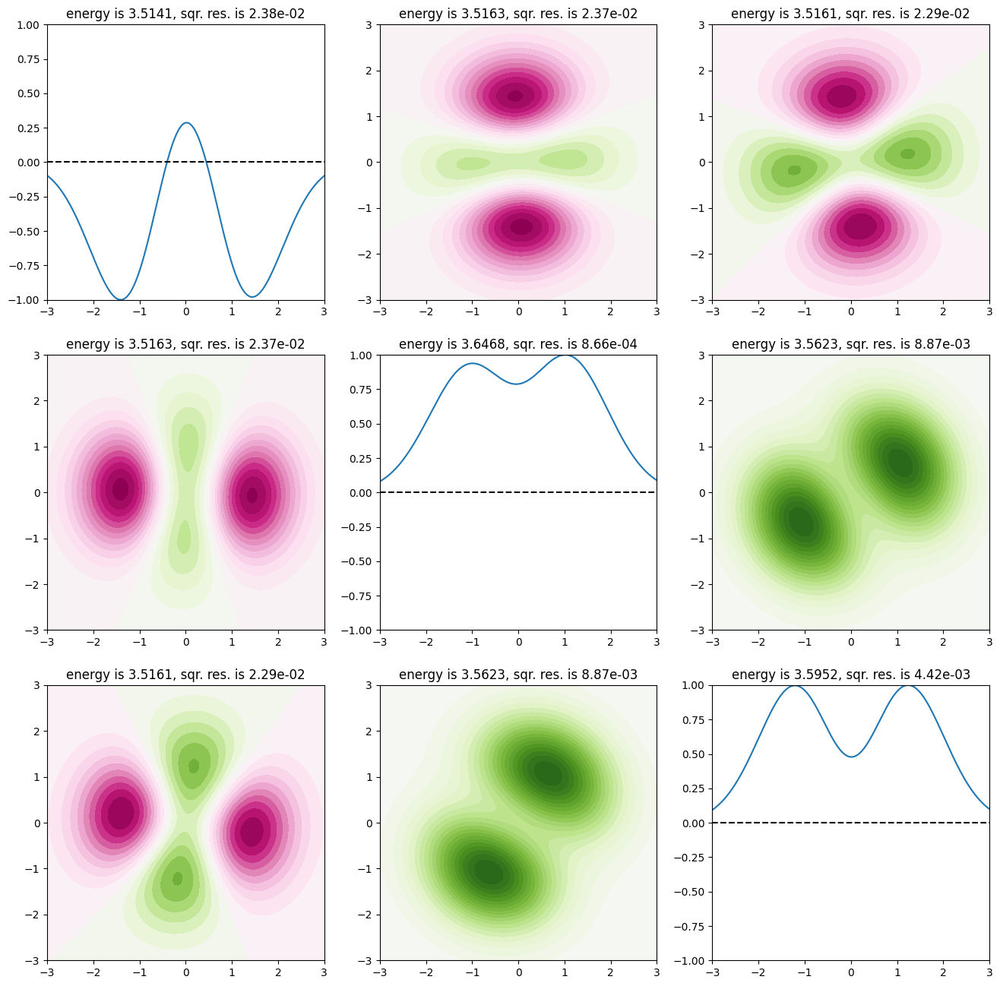

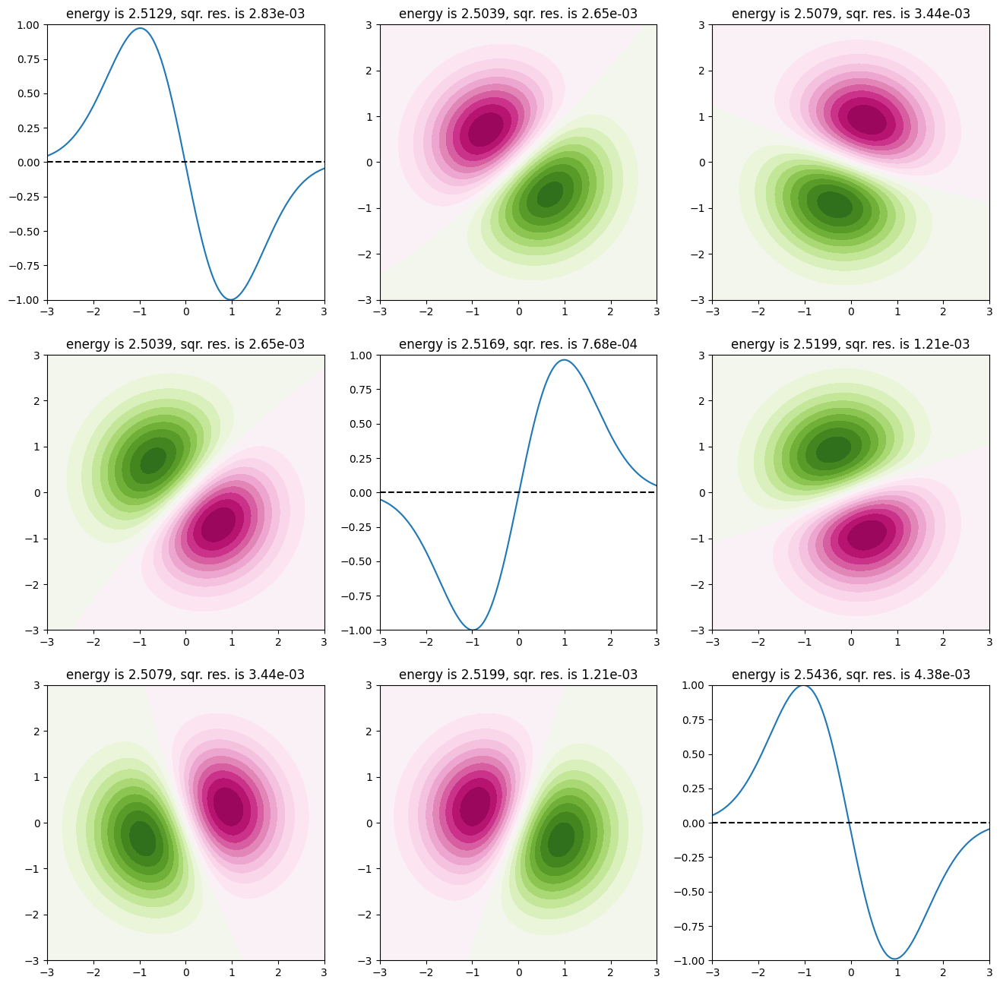

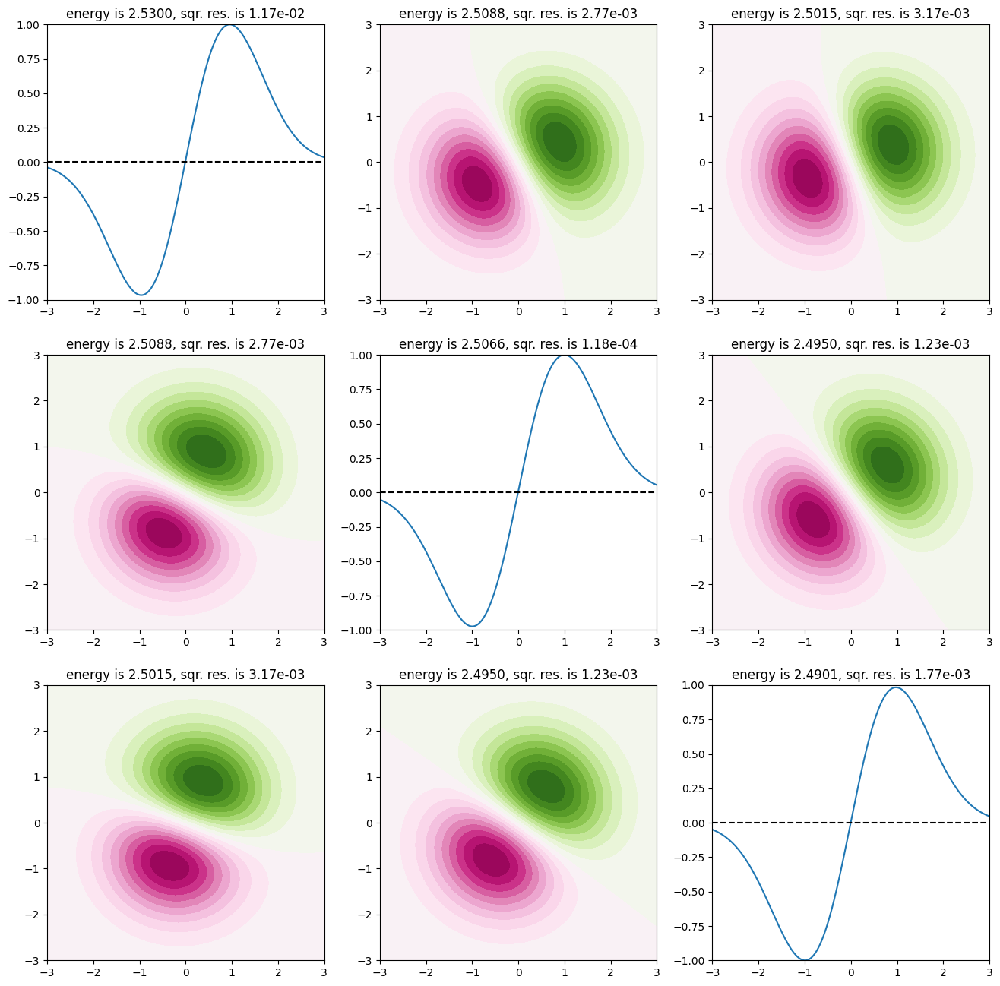

In [106]:
name = "L20_Nh1_21Oct2023_23:33:11"

trialFunction_3D = TrialFunction(
    {
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 20,
        "number of hidden layers" : 1,
        "coordinate space dimension" : 3,
        "number of states" : 5,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    },
    "3d_"+name
)
trialFunction_3D.load_state_dict(torch.load(trialFunction_3D.PATH))
trialFunction_3D.eval()

figs = footprintPlot(modelConfig={
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 20,
        "number of hidden layers" : 1,
        "coordinate space dimension" : 3,
        "number of states" : 5,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    }, modelName="3d_"+name, modelPath=trialFunction_3D.PATH, states=[0,1,2,3,4])

In [145]:
for m, fig in enumerate(figs):
    fig.savefig(f"../images/3d5m_best_{m}.png")

In [93]:
def numberOfLearnableParams(D,M,N_d,N_ls):
    return (D*N_ls+N_ls)+(N_d-1)*(N_ls**2+N_ls)+(N_ls*M+M)

In [170]:
numberOfLearnableParams(D=5,M=5,N_d=1,N_ls=5)

60

Text(0.5, 0, 'number of hidden layers')

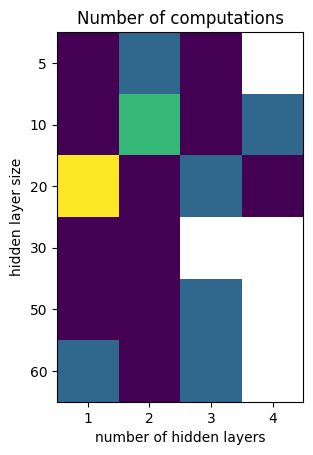

In [24]:

figs = footprintPlot(modelConfig, modelName, modelPath, states=[])

## 4D 5M

In [148]:
trials = pd.read_csv("../optuna_trials/4d_stdsqrt01.csv")

/tmp/ipykernel_1674/2261065826.py:41: RuntimeWarning: Mean of empty slice.
  ]['value'].to_numpy().mean()
/home/akozlov/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


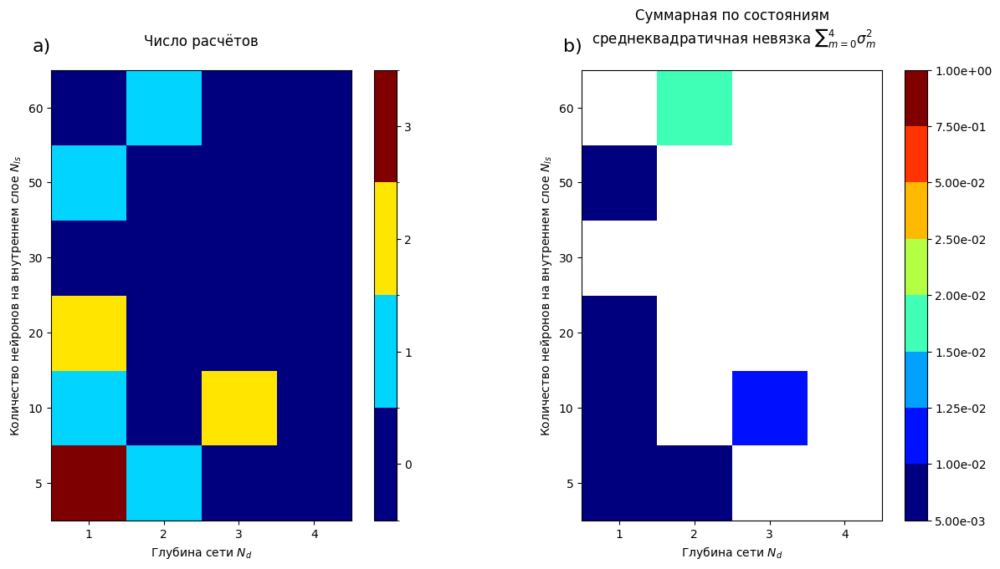

In [150]:
fig, ax = plt.subplots(1, 2, figsize=(15,7))

hiddenLayerSizes = [5,10,20,30,50,60]
numbersOfHiddenLayers = [1,2,3,4]

ax[0].set_title("Число расчётов"+"\n")

numberOfCompilations = np.full((6,4), 0.0)
for i, hiddenLayerSize in enumerate(hiddenLayerSizes):
    for j, numberOfHiddenLayers in enumerate(numbersOfHiddenLayers):
        amount = len(
            trials[
            (trials['state']=='COMPLETE')
            *(trials['params_hidden layer size']==hiddenLayerSize)
            *(trials['params_number of hidden layers']==numberOfHiddenLayers)
            ]
        )
        if amount > 0:
            numberOfCompilations[i,j] = len(trials[
                (trials['state']=='COMPLETE')
                *(trials['params_hidden layer size']==hiddenLayerSize)
                *(trials['params_number of hidden layers']==numberOfHiddenLayers)
                ]
            )

pcol1 = ax[0].imshow(numberOfCompilations, cmap='jet', origin='lower', norm=colors.BoundaryNorm(boundaries=[-0.5,0.5,1.5,2.5,3.5], ncolors=256),)
ax[0].set_yticks(np.arange(len(hiddenLayerSizes)), labels=hiddenLayerSizes)
ax[0].set_ylabel(r'Количество нейронов на внутреннем слое $N_{ls}$')
ax[0].set_xticks(np.arange(len(numbersOfHiddenLayers)), labels=numbersOfHiddenLayers)
ax[0].set_xlabel(r'Глубина сети $N_d$')
cbar1 = plt.colorbar(pcol1, ticks=[0,1,2,3])

ax[1].set_title("Суммарная по состояниям\n среднеквадратичная "+"невязка $\sum {}_{m=0}^{4} \sigma^2_m$"+"\n")
finalResults = np.zeros((6,4))
for i, hiddenLayerSize in enumerate(hiddenLayerSizes):
    for j, numberOfHiddenLayers in enumerate(numbersOfHiddenLayers):
        finalResults[i,j] = trials[
            (trials['state']=='COMPLETE')
            *(trials['params_hidden layer size']==hiddenLayerSize)
            *(trials['params_number of hidden layers']==numberOfHiddenLayers)
            ]['value'].to_numpy().mean()
bounds = [0.005,0.01,0.0125,0.015,0.02,0.025,0.05,0.75,1]
im2 = ax[1].imshow(
    finalResults,
    cmap='jet',
    norm=colors.BoundaryNorm(boundaries=bounds, ncolors=256),
    origin='lower'
)
ax[1].set_yticks(np.arange(len(hiddenLayerSizes)), labels=hiddenLayerSizes)
ax[1].set_ylabel(r'Количество нейронов на внутреннем слое $N_{ls}$')
ax[1].set_xticks(np.arange(len(numbersOfHiddenLayers)), labels=numbersOfHiddenLayers)
ax[1].set_xlabel(r'Глубина сети $N_d$')
cbar2 = plt.colorbar(im2, ticks=bounds)
cbar2.set_ticklabels([f"{b:.2e}" for b in bounds])

# fig.subplots_adjust(wspace=0.)

ax[0].text(-0.75,5.75,"a)", fontsize=16)
ax[1].text(-0.75,5.75,"b)", fontsize=16)

fig.savefig("../images/4d5m.png")

In [151]:
trials[trials['value'] == trials['value'].min()]

,Unnamed: 0,number,value,datetime_start,datetime_complete,duration,params_hidden layer size,params_number of hidden layers,state
47,47,47,0.004683,2023-10-23 05:44:31.074123,2023-10-23 06:01:59.758199,0 days 00:17:28.684076,5,1,COMPLETE


In [152]:
ls ../models/4d_L5*

../models/4d_L50_Nh1_22Oct2023_21:47:06.pt
../models/4d_L5_Nh1_23Oct2023_00:16:57.pt
../models/4d_L5_Nh1_23Oct2023_00:43:48.pt
../models/4d_L5_Nh1_23Oct2023_01:09:14.pt
../models/4d_L5_Nh1_23Oct2023_01:27:06.pt
../models/4d_L5_Nh1_23Oct2023_02:08:04.pt
../models/4d_L5_Nh1_23Oct2023_02:44:31.pt
../models/4d_L5_Nh2_23Oct2023_01:45:03.pt


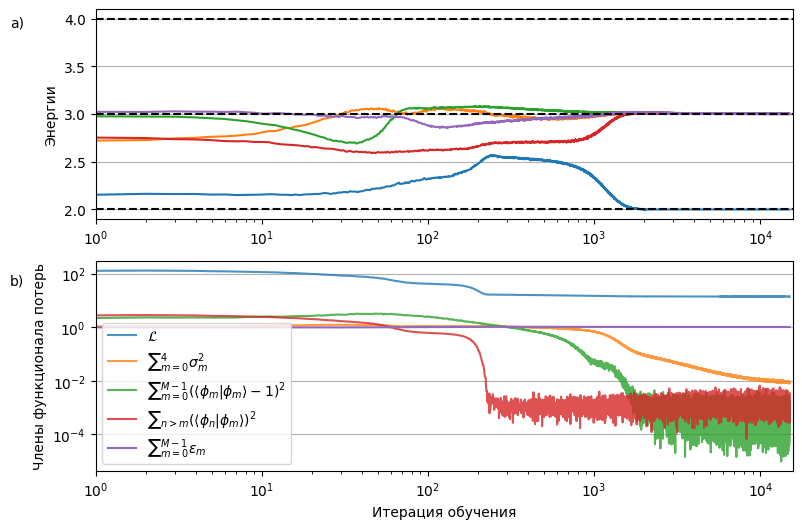

In [160]:
name = "L5_Nh1_23Oct2023_02:44:31"

timeHistory_1 = pd.read_csv("../loss/time_4d_"+name+".csv")
lossHistory_1 = pd.read_csv("../loss/loss_4d_"+name+".csv")
eHistory_1 = pd.read_csv("../loss/e_4d_"+name+".csv")

fig, axes = plt.subplots(2, 1, figsize=(9,6))

numberOfStates = 16

eHistory_1[eHistory_1.columns[1:]].plot(ax=axes[0], xlim=(1,None), legend=False)
axes[0].grid(axis='y', which='both')
for y in [2,3,4]:
    axes[0].axhline(y=y, color='k', linestyle='--')
axes[0].minorticks_on
# axes[0].set_yscale("log")
axes[0].set_xscale("log")
axes[0].set_ylabel("Энергии")
# axes[0].set_xlim(1e3,None)
# axes[0].set_ylim(1,10)

labels=[r'$\mathcal{L}$',
        r'$\sum {}_{m=0}^4\sigma_m^2$', 
        r'$\sum {}_{m=0}^{M-1} ( \langle \phi_m | \phi_m \rangle - 1)^2$', 
        r'$\sum {}_{n>m} ( \langle \phi_n | \phi_m \rangle )^2$']

for i, col in enumerate(lossHistory_1.columns[1:]):
    plt.plot(lossHistory_1[col].to_numpy(), alpha=0.8, label=labels[i])

axes[1].set_xlim(1,None)
axes[1].legend()
axes[1].plot(eHistory_1[eHistory_1.columns[1:]].to_numpy().sum(axis=1)/eHistory_1[eHistory_1.columns[1:]].to_numpy().sum(axis=1)[0], label=r'$\sum {}_{m=0}^{M-1} \epsilon_m$')
axes[1].legend()
axes[1].grid(axis='y')
axes[1].set_yscale("log")
axes[1].set_xscale("log")
axes[1].set_ylabel("Члены функционала потерь")
axes[1].set_xlabel("Итерация обучения")

plt.figtext(0.03,0.85,"a)")
plt.figtext(0.03,0.42,"b)")

fig.savefig("../images/4d5m_best.png")

Trial function with name 4d_L5_Nh1_23Oct2023_02:44:31 has been created
Trial function with name 4d_L5_Nh1_23Oct2023_02:44:31 has been created
0
1
2
3
4


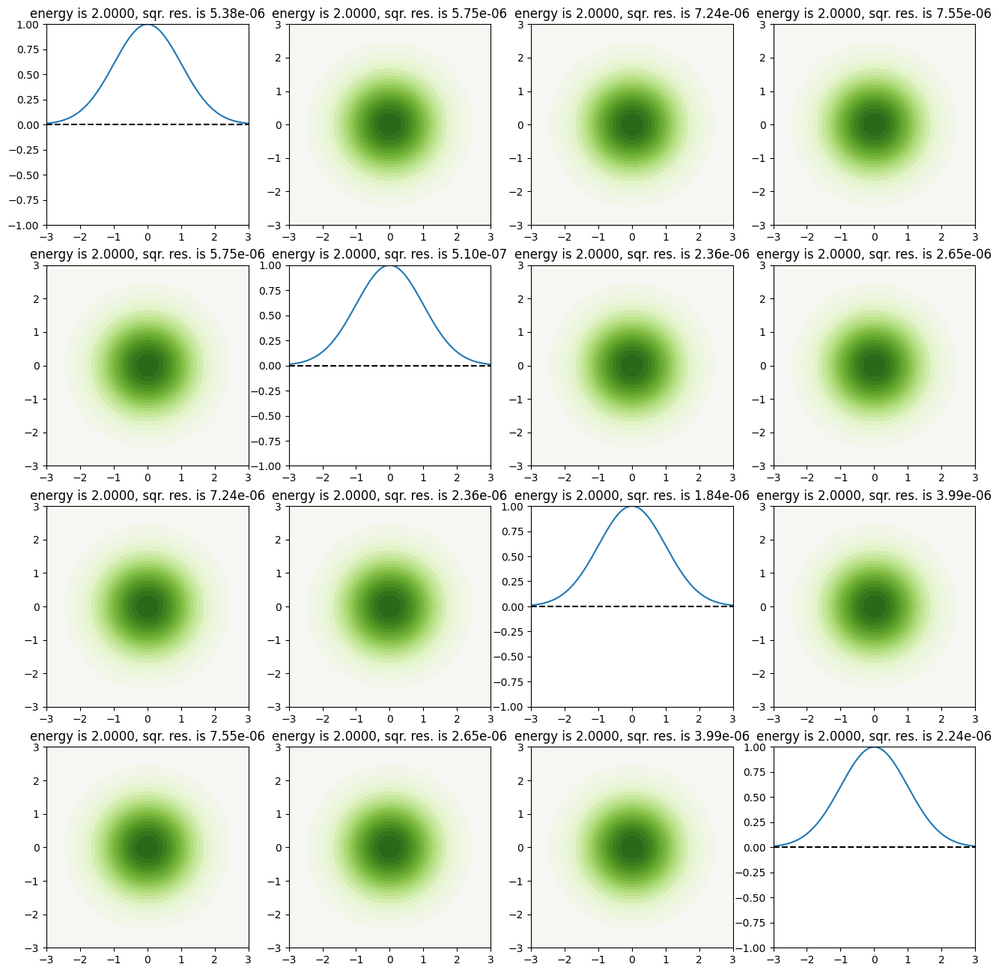

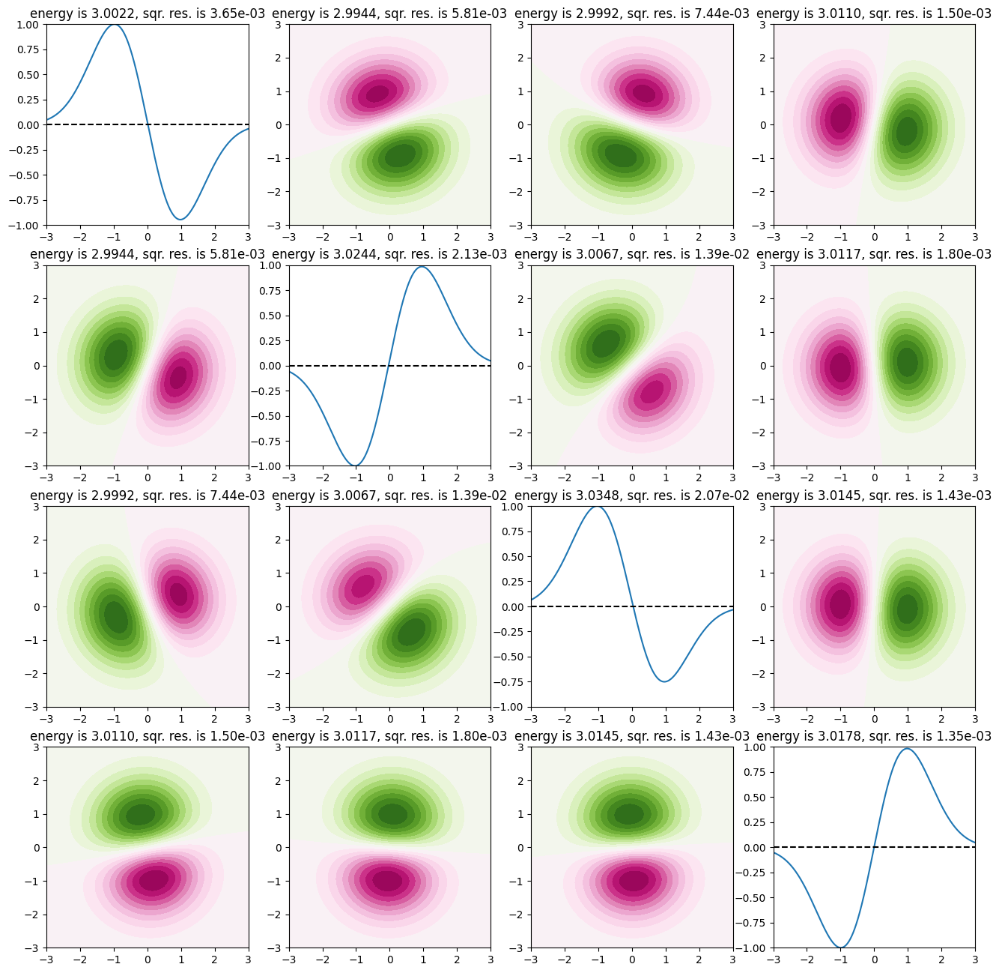

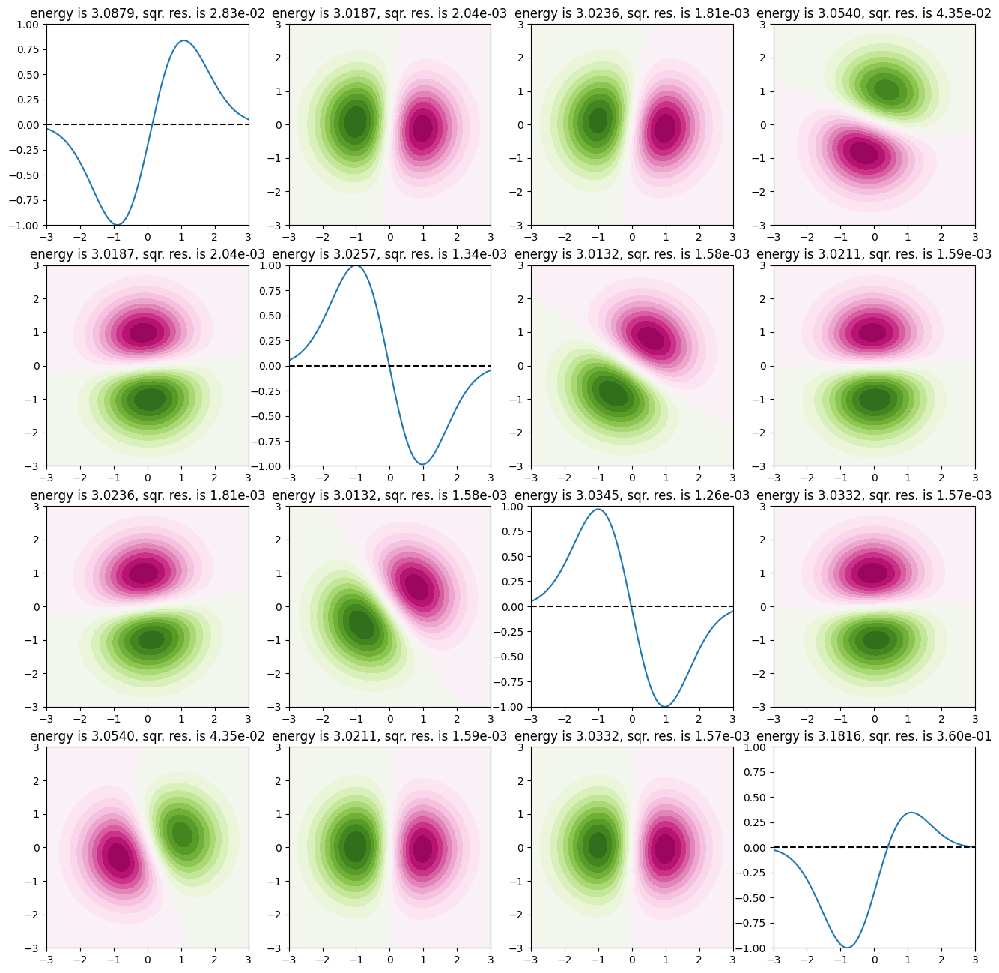

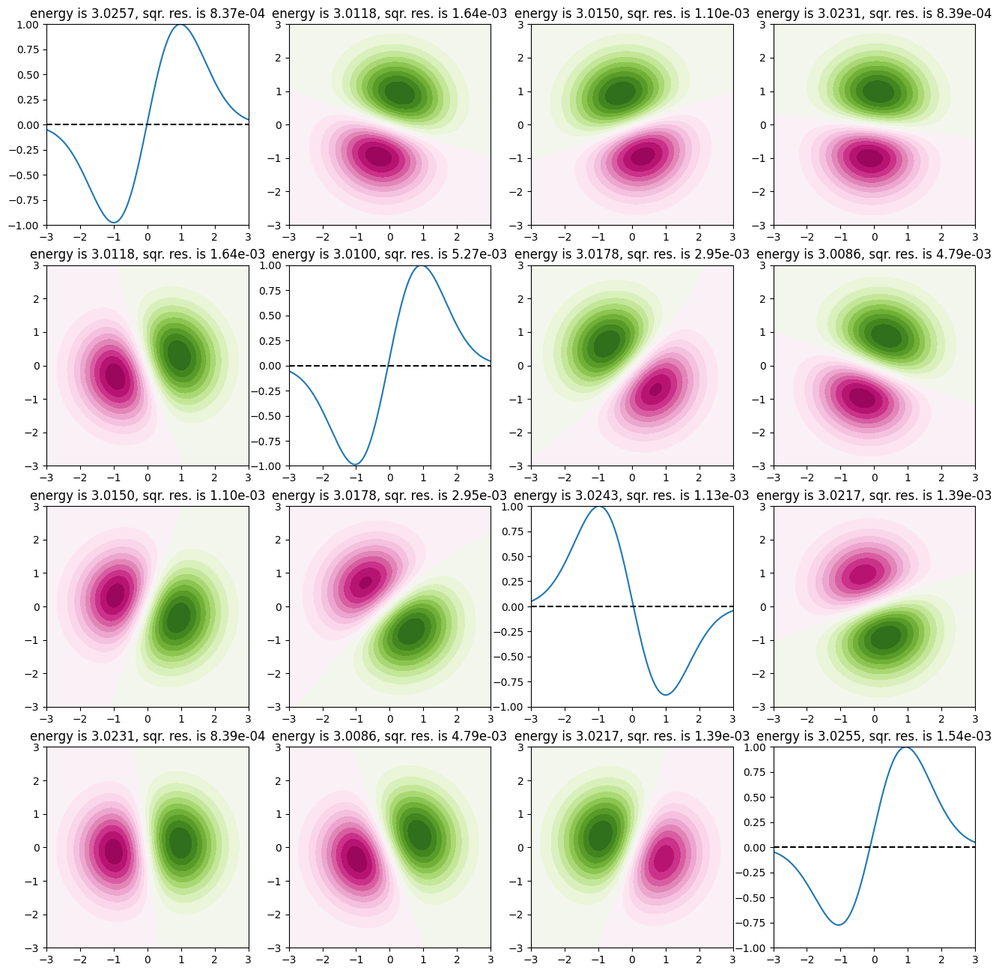

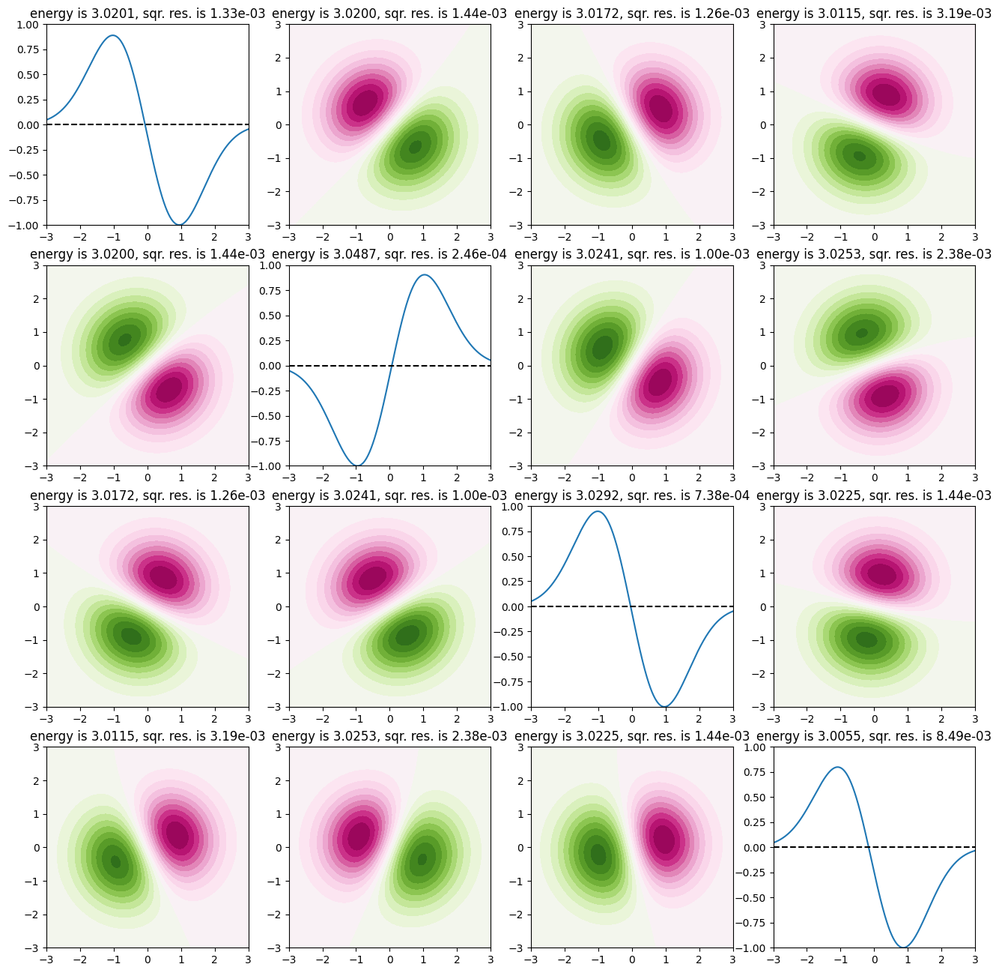

In [154]:
trialFunction_3D = TrialFunction(
    {
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 5,
        "number of hidden layers" : 1,
        "coordinate space dimension" : 4,
        "number of states" : 5,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    },
    "4d_"+name
)
trialFunction_3D.load_state_dict(torch.load(trialFunction_3D.PATH))
trialFunction_3D.eval()

figs = footprintPlot(modelConfig={
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 5,
        "number of hidden layers" : 1,
        "coordinate space dimension" : 4,
        "number of states" : 5,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    }, modelName="4d_"+name, modelPath=trialFunction_3D.PATH, states=[0,1,2,3,4])

In [155]:
for m, fig in enumerate(figs):
    fig.savefig(f"../images/4d5m_best_{m}.png")

## 5D 5M

In [161]:
trials = pd.read_csv("../optuna_trials/5d_stdsqrt01.csv")

/tmp/ipykernel_1674/2211402530.py:41: RuntimeWarning: Mean of empty slice.
  ]['value'].to_numpy().mean()
/home/akozlov/.local/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


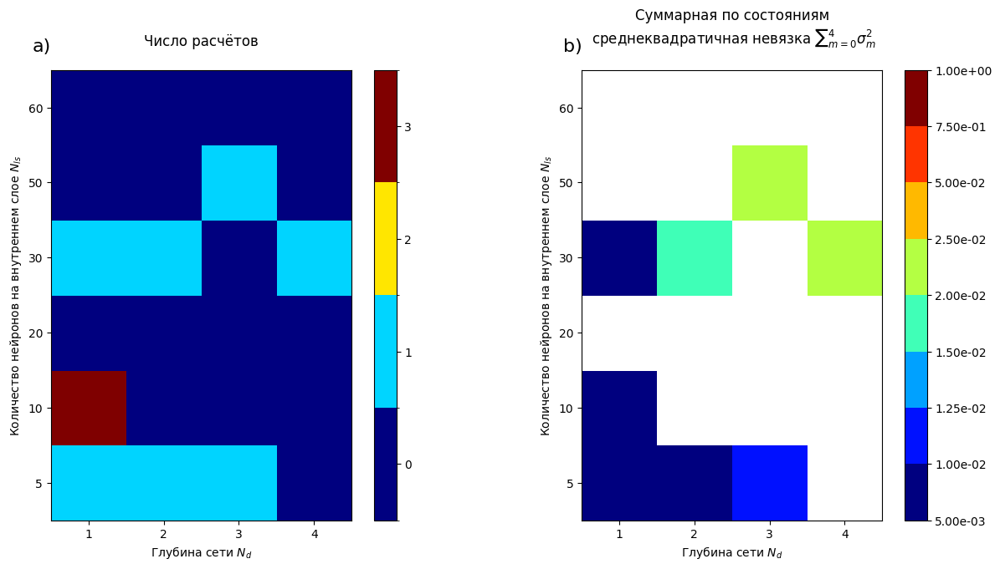

In [164]:
fig, ax = plt.subplots(1, 2, figsize=(15,7))

hiddenLayerSizes = [5,10,20,30,50,60]
numbersOfHiddenLayers = [1,2,3,4]

ax[0].set_title("Число расчётов"+"\n")

numberOfCompilations = np.full((6,4), 0.0)
for i, hiddenLayerSize in enumerate(hiddenLayerSizes):
    for j, numberOfHiddenLayers in enumerate(numbersOfHiddenLayers):
        amount = len(
            trials[
            (trials['state']=='COMPLETE')
            *(trials['params_hidden layer size']==hiddenLayerSize)
            *(trials['params_number of hidden layers']==numberOfHiddenLayers)
            ]
        )
        if amount > 0:
            numberOfCompilations[i,j] = len(trials[
                (trials['state']=='COMPLETE')
                *(trials['params_hidden layer size']==hiddenLayerSize)
                *(trials['params_number of hidden layers']==numberOfHiddenLayers)
                ]
            )

pcol1 = ax[0].imshow(numberOfCompilations, cmap='jet', origin='lower', norm=colors.BoundaryNorm(boundaries=[-0.5,0.5,1.5,2.5,3.5], ncolors=256),)
ax[0].set_yticks(np.arange(len(hiddenLayerSizes)), labels=hiddenLayerSizes)
ax[0].set_ylabel(r'Количество нейронов на внутреннем слое $N_{ls}$')
ax[0].set_xticks(np.arange(len(numbersOfHiddenLayers)), labels=numbersOfHiddenLayers)
ax[0].set_xlabel(r'Глубина сети $N_d$')
cbar1 = plt.colorbar(pcol1, ticks=[0,1,2,3])

ax[1].set_title("Суммарная по состояниям\n среднеквадратичная "+"невязка $\sum {}_{m=0}^{4} \sigma^2_m$"+"\n")
finalResults = np.zeros((6,4))
for i, hiddenLayerSize in enumerate(hiddenLayerSizes):
    for j, numberOfHiddenLayers in enumerate(numbersOfHiddenLayers):
        finalResults[i,j] = trials[
            (trials['state']=='COMPLETE')
            *(trials['params_hidden layer size']==hiddenLayerSize)
            *(trials['params_number of hidden layers']==numberOfHiddenLayers)
            ]['value'].to_numpy().mean()
bounds = [0.005,0.01,0.0125,0.015,0.02,0.025,0.05,0.75,1]
im2 = ax[1].imshow(
    finalResults,
    cmap='jet',
    norm=colors.BoundaryNorm(boundaries=bounds, ncolors=256),
    origin='lower'
)
ax[1].set_yticks(np.arange(len(hiddenLayerSizes)), labels=hiddenLayerSizes)
ax[1].set_ylabel(r'Количество нейронов на внутреннем слое $N_{ls}$')
ax[1].set_xticks(np.arange(len(numbersOfHiddenLayers)), labels=numbersOfHiddenLayers)
ax[1].set_xlabel(r'Глубина сети $N_d$')
cbar2 = plt.colorbar(im2, ticks=bounds)
cbar2.set_ticklabels([f"{b:.2e}" for b in bounds])

# fig.subplots_adjust(wspace=0.)

ax[0].text(-0.75,5.75,"a)", fontsize=16)
ax[1].text(-0.75,5.75,"b)", fontsize=16)

fig.savefig("../images/5d5m.png")

In [163]:
trials[trials['value'] == trials['value'].min()]

,Unnamed: 0,number,value,datetime_start,datetime_complete,duration,params_hidden layer size,params_number of hidden layers,state
35,35,35,0.004153,2023-10-23 22:43:51.214513,2023-10-23 23:04:56.737091,0 days 00:21:05.522578,5,1,COMPLETE


In [165]:
ls ../models/5d_L5*

../models/5d_L50_Nh3_23Oct2023_07:42:18.pt
../models/5d_L5_Nh1_23Oct2023_19:43:51.pt
../models/5d_L5_Nh2_23Oct2023_16:15:52.pt
../models/5d_L5_Nh3_23Oct2023_06:19:05.pt


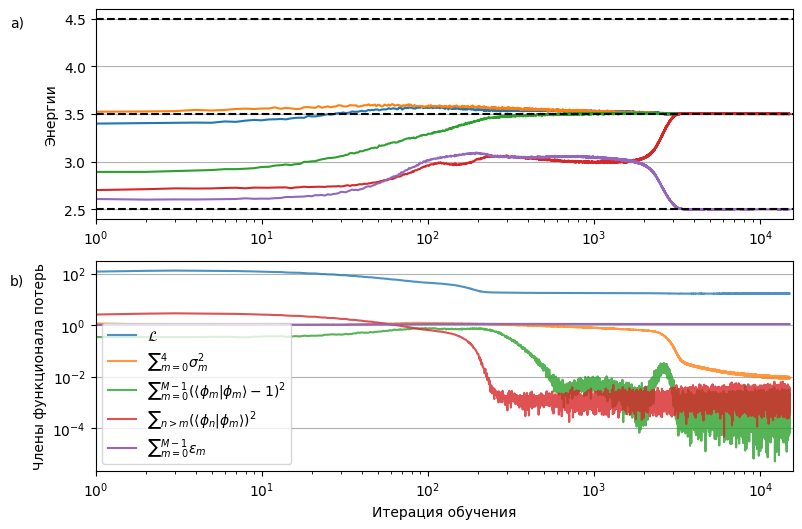

In [166]:
name = "L5_Nh1_23Oct2023_19:43:51"

timeHistory_1 = pd.read_csv("../loss/time_5d_"+name+".csv")
lossHistory_1 = pd.read_csv("../loss/loss_5d_"+name+".csv")
eHistory_1 = pd.read_csv("../loss/e_5d_"+name+".csv")

fig, axes = plt.subplots(2, 1, figsize=(9,6))

numberOfStates = 16

eHistory_1[eHistory_1.columns[1:]].plot(ax=axes[0], xlim=(1,None), legend=False)
axes[0].grid(axis='y', which='both')
for y in [2.5,3.5,4.5]:
    axes[0].axhline(y=y, color='k', linestyle='--')
axes[0].minorticks_on
# axes[0].set_yscale("log")
axes[0].set_xscale("log")
axes[0].set_ylabel("Энергии")
# axes[0].set_xlim(1e3,None)
# axes[0].set_ylim(1,10)

labels=[r'$\mathcal{L}$',
        r'$\sum {}_{m=0}^4\sigma_m^2$', 
        r'$\sum {}_{m=0}^{M-1} ( \langle \phi_m | \phi_m \rangle - 1)^2$', 
        r'$\sum {}_{n>m} ( \langle \phi_n | \phi_m \rangle )^2$']

for i, col in enumerate(lossHistory_1.columns[1:]):
    plt.plot(lossHistory_1[col].to_numpy(), alpha=0.8, label=labels[i])

axes[1].set_xlim(1,None)
axes[1].legend()
axes[1].plot(eHistory_1[eHistory_1.columns[1:]].to_numpy().sum(axis=1)/eHistory_1[eHistory_1.columns[1:]].to_numpy().sum(axis=1)[0], label=r'$\sum {}_{m=0}^{M-1} \epsilon_m$')
axes[1].legend()
axes[1].grid(axis='y')
axes[1].set_yscale("log")
axes[1].set_xscale("log")
axes[1].set_ylabel("Члены функционала потерь")
axes[1].set_xlabel("Итерация обучения")

plt.figtext(0.03,0.85,"a)")
plt.figtext(0.03,0.42,"b)")

fig.savefig("../images/5d5m_best.png")

Trial function with name 5d_L5_Nh1_23Oct2023_19:43:51 has been created
Trial function with name 5d_L5_Nh1_23Oct2023_19:43:51 has been created
0
1
2
3
4


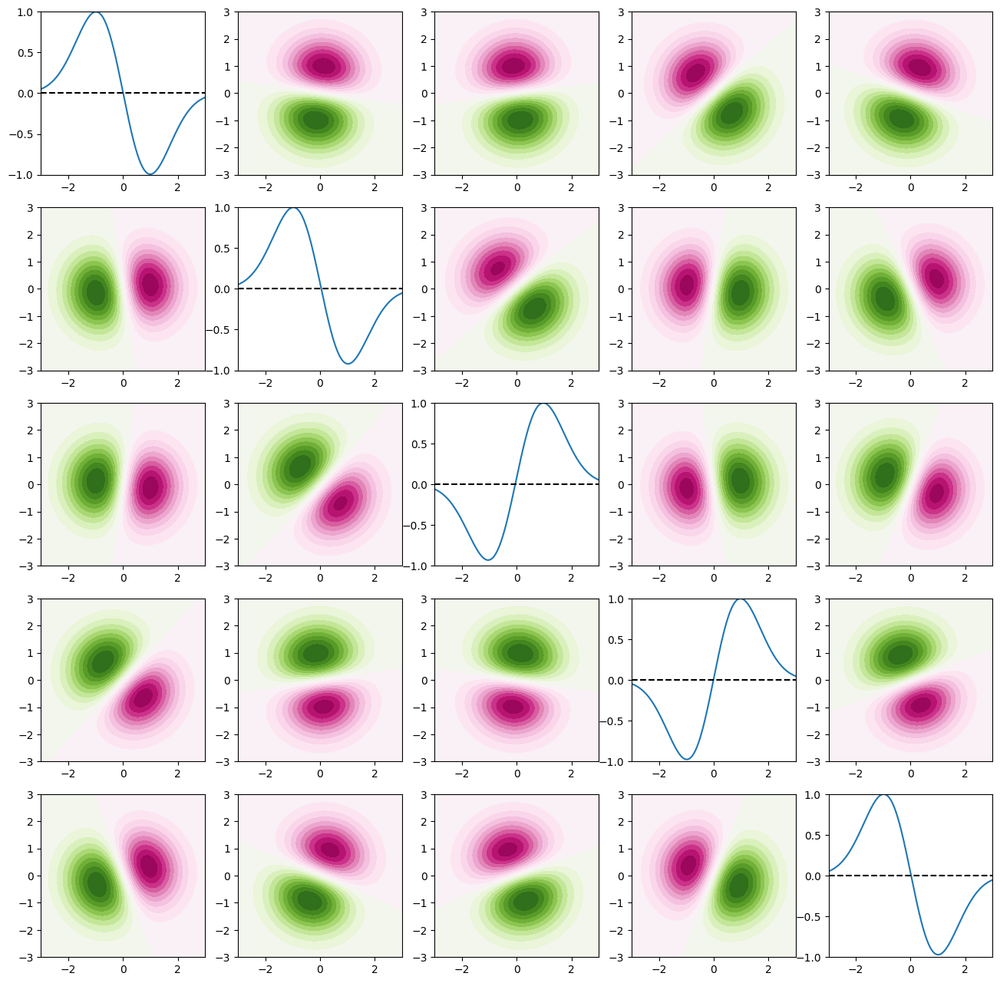

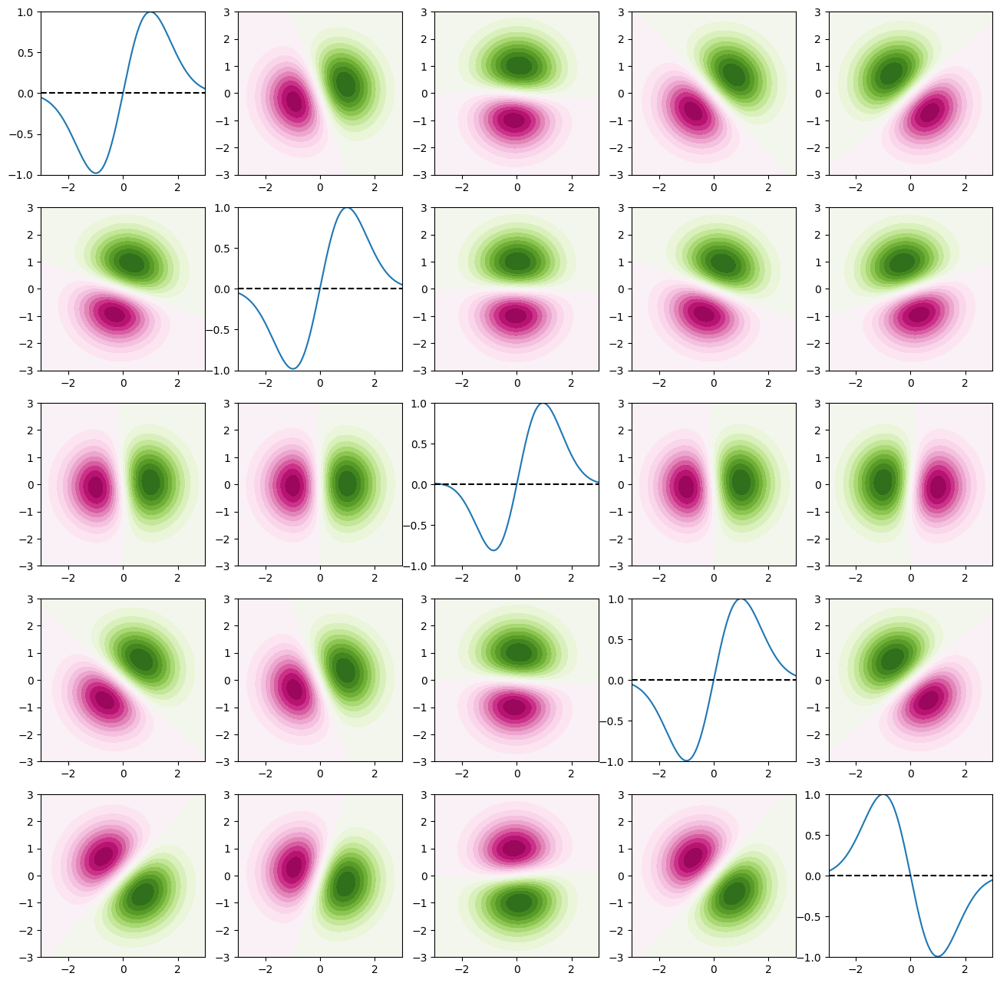

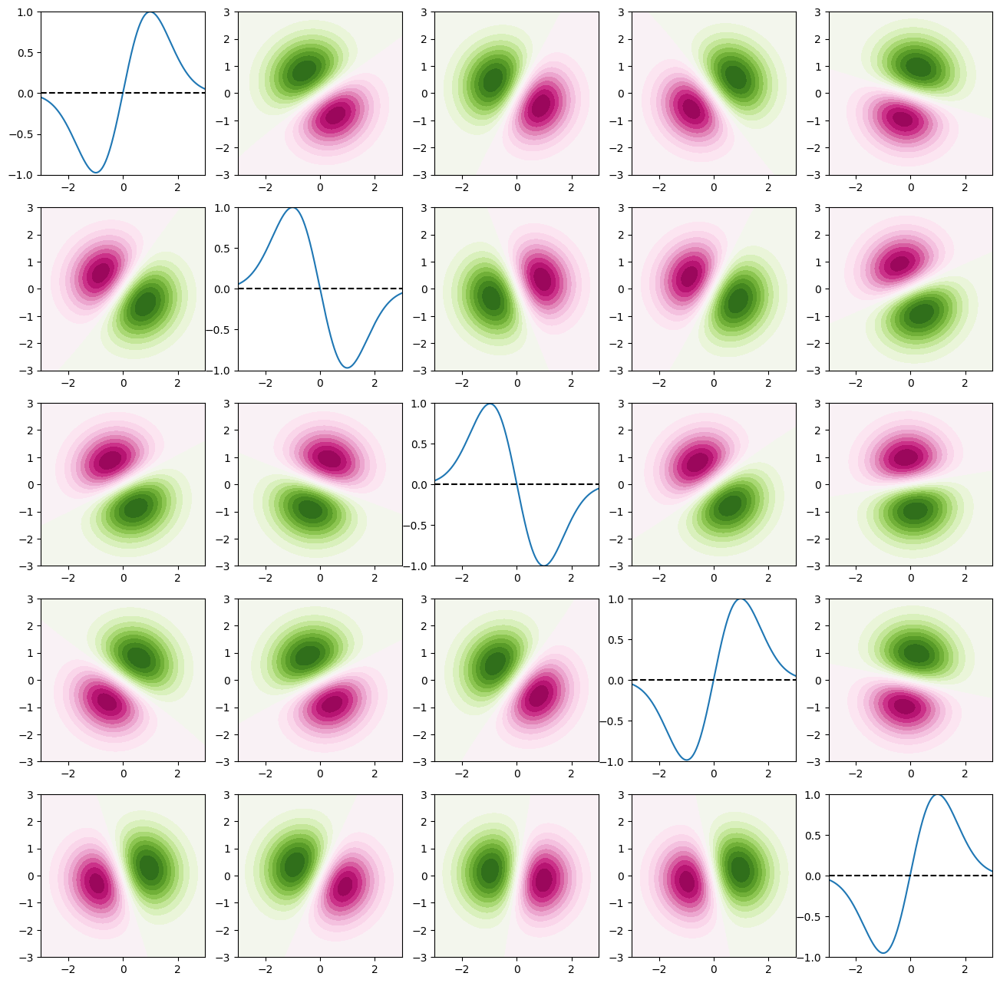

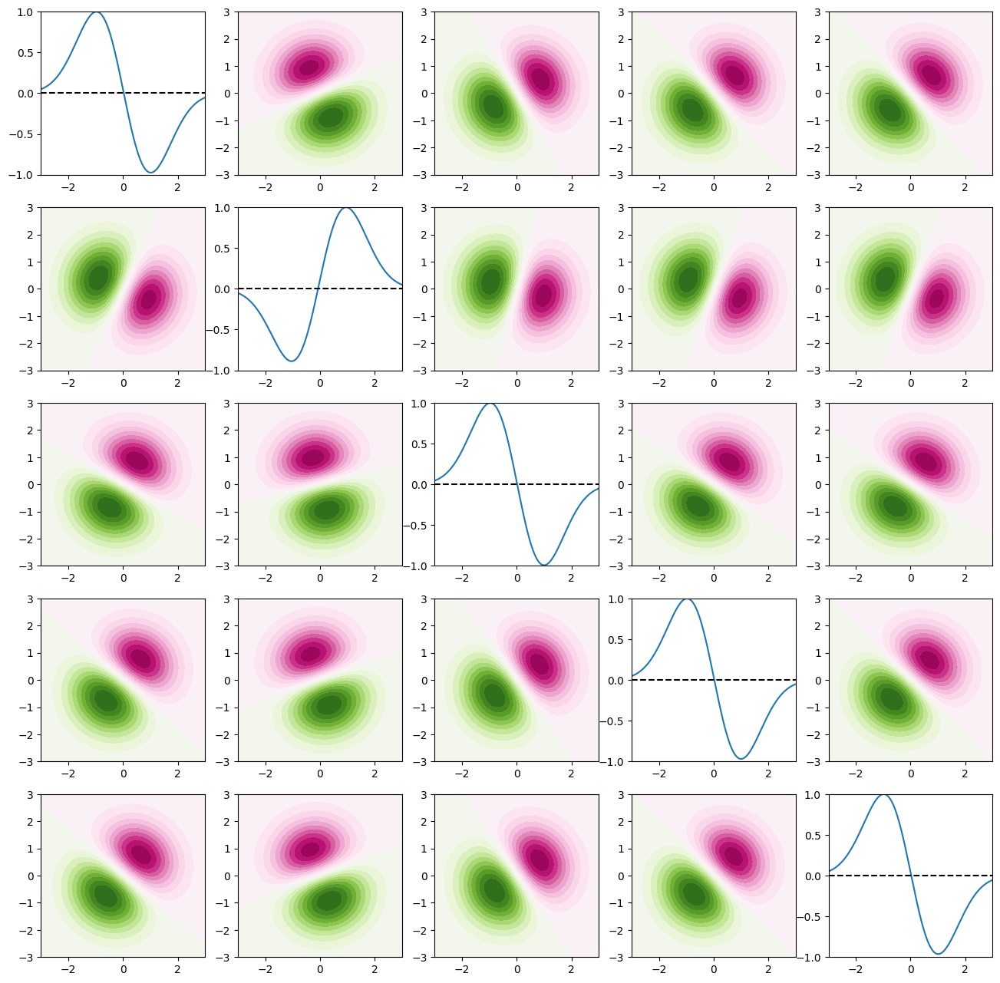

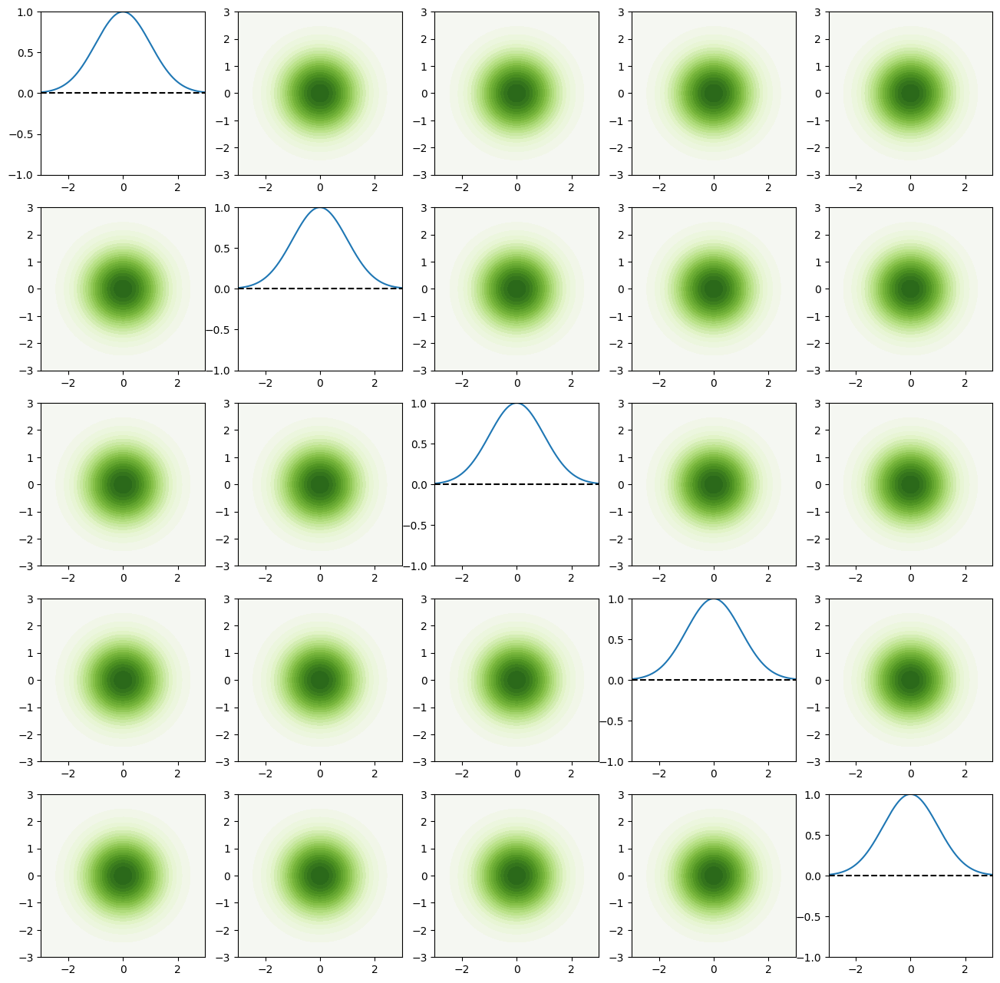

In [167]:
trialFunction_3D = TrialFunction(
    {
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 5,
        "number of hidden layers" : 1,
        "coordinate space dimension" : 5,
        "number of states" : 5,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    },
    "5d_"+name
)
trialFunction_3D.load_state_dict(torch.load(trialFunction_3D.PATH))
trialFunction_3D.eval()

figs = footprintPlot(modelConfig={
        "device" : "cuda" if torch.cuda.is_available() else "cpu",
        "activation function" : "sin",
        "amplitude function" : "gaussian",
        "hidden layer size" : 5,
        "number of hidden layers" : 1,
        "coordinate space dimension" : 5,
        "number of states" : 5,
        "sample size" : 8192,
        "initial learning rate" : 1e-3,
        "weight decay" : 1e-3,
        "residual term weight" : 1.0,
        "normalisation term weight" : 1.0,
        "orthogonalisation term weight" : 40.0,
        "energy term weigth" : 1.0,
        "metropolis algorithm parameter" : 1.0,
        "number of training steps" : 15000,
        "std of initial weights" : math.sqrt(0.1)
    }, modelName="5d_"+name, modelPath=trialFunction_3D.PATH, states=[0,1,2,3,4])

In [168]:
for m, fig in enumerate(figs):
    fig.savefig(f"../images/5d5m_best_{m}.png")